<img src="https://upload.wikimedia.org/wikipedia/commons/7/76/Grain_logo.png" style="float: left; margin: 0px; height: 80px">

<div style="clear: both;"></div>

<div>
    <h1>Capstone project: Business dashboard</h1>
    <p>Part 2 - Exploratory Data Analysis (EDA)</p>
</div>

---
## Problem Statement
The F&B industry in Singapore is valued at $13 billion a year. The food catering industry specifically is picking up post-covid19 and is expected to grow in the next few years. However, there are many issues that catering companies have to solve. We will focus on 3 issues.

1. Inventory management (Given past data, can we forecast demand to efficiently carry out inventory management?)
2. Price negotiation (What is the recommended price for customers from different sectors?)
3. Food quality: Delivery driver allocation (Is there a way to automatically assign drivers for deliveries to pick up hot food at the right timings and to effectively distribute the deliveries so that only a final check is needed?)

## Contents:
- [Import libraries](#Import-libraries) 
- [Import data](#Import-data)
- [Exploratory Data Analysis](#Exploratory-Data-Analysis)
    1. [Location (Where?)](##Location (Where?))
    2. [Month, week, day, and time (When?)](#month-week-day-and-time-when)
    3. [Sector (Who?)](#sector-who)


# Import libraries 

In [119]:
import pandas as pd       # Used for panel data manipulation 
import folium             # Used to plot the coordinates on the Singapore map
import geopandas as gpd   # Used to convert the geojson file data
import requests           # Used to get the latitude and longitude cooridnates from the onemap API
import json               # Used to extract the latitude and longitude cooridnates
import matplotlib.pyplot as plt # Used to plot bar charts
import numpy as np        # Used to do calculations 

# Import data 

In [478]:
# Import the cleaned data
df = pd.read_csv("../data/imputed_data.csv")

# Set the view limit to none
pd.set_option('display.max_columns', None) 
print(df.shape)
df.head()

(11121, 15)


,event_id,event_state,sales_type,sector,company_name,customer_id,cost_per_pax,pax,address,postal_code,special_instructions,pickup_date_time,serving_date_time,revenue,postal_code_new
0,F3253,PUBLISHED,inbound,Technology (software),Amazon Web Services Singapore Pte Ltd,50296,16.73,23,"8 Marina View, #23-01 Asia Square Tower 1",18960,call Mona upon upon arrival at level 23,2022-01-06T07:00:00,2022-01-06T08:00:00,399.79,18960
1,F3201,PUBLISHED,repeat,Pharmaceutical,Novartis (Singapore) Pte Ltd,26299,7.43,30,"1E Kent Ridge Rd, National University Cancer I...",119228,"30 x Bento + Cutlery | 39 x ripple cups, lids,...",2022-01-06T07:15:00,2022-01-06T08:15:00,308.13,119228
2,F3259,PUBLISHED,inbound,"Government, Nonprofits & Associations",Ministry of Manpower,50306,16.73,39,"18 Havlock Road, Main Entrance, Ministry of Ma...",59764,missing,2022-01-06T10:30:00,2022-01-06T11:30:00,661.77,59764
3,F3239,PUBLISHED,repeat,Hospitals,KK Women's and Children's Hospital,47121,9.30,50,"100 Bukit Timah Road, Department of Maternal F...",229899,50 x bento + cutlery | \n\nMs. Jasmine Lim – 9...,2022-01-06T10:30:00,2022-01-06T11:30:00,465.00,229899
4,F3254,PUBLISHED,inbound,Technology (software),Amazon Web Services Singapore Pte Ltd,50296,0.00,23,"8 Marina View, #23-01 Asia Square Tower 1",18960,missing,2022-01-06T10:30:00,2022-01-06T11:30:00,15.00,18960


# Exploratory Data Analysis
We will split this into 3 components<br>
1.) Location (Where?) <br>
2.) Month, week, day and time (When?) <br>
3.) Sector (Who?) 

## Location (Where?)
There is only data for the complete year of 2022. Therefore, we will find out where do the deliveries go to in the year of 2022.

**1.1) Get the new postal code to have leading zeros**

Some of the postal codes have 5 digits which is not correct as there is supposed to be a 0 in front. Therefore, we will add the leading zeros to the postal codes.

In [37]:
# Make a copy of the original DataFrame
new_df = df.copy()

# Convert the 'postal_code' column to integer
new_df['postal_code'] = new_df['postal_code'].astype(str)

# Define a function to add a leading zero to 5-digit postal codes
def add_leading_zero(p_code):
    if len(p_code) == 5:
        return '0' + p_code
    else:
        return p_code

# Apply the function to the 'postal_code' column in the DataFrame
new_df['postal_code_new'] = new_df['postal_code'].apply(add_leading_zero)

# Convert the 'postal_code' column back to integer
new_df['postal_code'] = new_df['postal_code'].astype(int)

# Display the sorted DataFrame
df = new_df
df.head()

Then we have to convert the postal codes to latitudes and longitudes coordinates. We will use onemap's api to convert the postal codes to latitude and longitude coordinates. 

**1.2) Use onemap's API to convert the postal codes to latitude and longitude coordinates**

In [33]:
# This cell will take some time to run
# Create an empty DataFrame to store the results
result_df = pd.DataFrame(columns=["Latitude", "Longitude"])

# Iterate over the rows in the DataFrame
for index, row in df.iterrows():
    postal_code = row['postal_code_new']
    url = f"https://www.onemap.gov.sg/api/common/elastic/search?searchVal={postal_code}&returnGeom=Y&getAddrDetails=Y&pageNum=1"
    response = requests.get(url)

    if response.status_code == 200:
        data = response.json()

        if "results" in data and len(data["results"]) > 0:
            result = data["results"][0]
            latitude = result.get("LATITUDE")
            longitude = result.get("LONGITUDE")

            if latitude and longitude:
                result_df = pd.concat([result_df, pd.DataFrame({"Latitude": [latitude], "Longitude": [longitude]})], ignore_index=True)
            else:
                print(f"Latitude and Longitude are not available for postal code {postal_code}.")
        else:
            print(f"No results found for postal code {postal_code}.")
    else:
        print(f"Failed to retrieve data from the API for postal code {postal_code}.")

# Append the result_df to your original DataFrame 'df'
df = pd.concat([df, result_df], axis=1)

# Now 'df' contains the additional columns 'LATITUDE' and 'LONGITUDE'
df

No results found for postal code 169680.
No results found for postal code 698577.
No results found for postal code 534390.
No results found for postal code 619134.
No results found for postal code 117561.
No results found for postal code 117561.
No results found for postal code 738619.
No results found for postal code 117561.
No results found for postal code 117561.
No results found for postal code 117561.
No results found for postal code 117561.
No results found for postal code 738619.
No results found for postal code 738619.
No results found for postal code 738619.
No results found for postal code 659123.
No results found for postal code 659123.
No results found for postal code 019191.
No results found for postal code 019191.
No results found for postal code 019191.
No results found for postal code 019191.
No results found for postal code 019191.
No results found for postal code 019191.
No results found for postal code 019191.
No results found for postal code 019191.
No results found

,event_id,event_state,sales_type,sector,company_name,customer_id,cost_per_pax,pax,address,postal_code,special_instructions,pickup_date_time,serving_date_time,revenue,postal_code_new,Latitude,Longitude,Latitude,Longitude
0,F3253,PUBLISHED,inbound,Technology (software),Amazon Web Services Singapore Pte Ltd,50296,16.73,23,"8 Marina View, #23-01 Asia Square Tower 1",18960,call Mona upon upon arrival at level 23,2022-01-06 07:00:00,2022-01-06T08:00:00,399.79,018960,1.27874566853514,103.851270544365,1.27894148629275,103.851256039975
1,F3201,PUBLISHED,repeat,Pharmaceutical,Novartis (Singapore) Pte Ltd,26299,7.43,30,"1E Kent Ridge Rd, National University Cancer I...",119228,"30 x Bento + Cutlery | 39 x ripple cups, lids,...",2022-01-06 07:15:00,2022-01-06T08:15:00,308.13,119228,1.29234898139799,103.783470532707,1.29234898139799,103.783470532707
2,F3259,PUBLISHED,inbound,"Government, Nonprofits & Associations",Ministry of Manpower,50306,16.73,39,"18 Havlock Road, Main Entrance, Ministry of Ma...",59764,missing,2022-01-06 10:30:00,2022-01-06T11:30:00,661.77,059764,1.28763824061475,103.843976671938,1.28742620254799,103.844319527464
3,F3239,PUBLISHED,repeat,Hospitals,KK Women's and Children's Hospital,47121,9.30,50,"100 Bukit Timah Road, Department of Maternal F...",229899,50 x bento + cutlery | \n\nMs. Jasmine Lim – 9...,2022-01-06 10:30:00,2022-01-06T11:30:00,465.00,229899,1.31044853126535,103.846650072852,1.31044853126535,103.846650072852
4,F3254,PUBLISHED,inbound,Technology (software),Amazon Web Services Singapore Pte Ltd,50296,0.00,23,"8 Marina View, #23-01 Asia Square Tower 1",18960,missing,2022-01-06 10:30:00,2022-01-06T11:30:00,15.00,018960,1.27894148629275,103.851256039975,1.27894148629275,103.851256039975
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11116,H1899,PUBLISHED,inbound,Technology (software),Rakuten,43527,0.00,100,"138 Market street, CapitaGreen #32-01",48946,missing,2023-01-31 15:00:00,2023-01-31T16:15:00,643.68,048946,NaN,NaN,NaN,NaN
11117,H1944,PUBLISHED,inbound,missing,missing,64009,21.50,15,"ONE°15 Marina Club, 11 Cove Drive, Sentosa Cove",98497,Do not be late as this delivery is for a yacht...,2023-01-31 15:45:00,2023-01-31T17:00:00,392.50,098497,NaN,NaN,NaN,NaN
11118,H0475,PUBLISHED,repeat,Information Technology,MELTWATER NEWS SG1 PTE. LTD,61137,23.96,67,60 Anson Road #18-03A,79914,missing,2023-01-31 16:45:00,2023-01-31T18:00:00,1619.21,079914,NaN,NaN,NaN,NaN
11119,H0645,PUBLISHED,outbound,missing,missing,62984,18.50,25,"Function room at Westwood Residences, 190 West...",648150,Contact Jio @ 9675 6134,2023-01-31 16:45:00,2023-01-31T18:00:00,542.50,648150,NaN,NaN,NaN,NaN


**1.2.1) Check where the missing information are**

In [40]:
# Set the option to display all rows
pd.set_option('display.max_rows', None)
df

,event_id,event_state,sales_type,sector,company_name,customer_id,cost_per_pax,pax,address,postal_code,special_instructions,pickup_date_time,serving_date_time,revenue,postal_code_new,Latitude,Longitude
0,F3253,PUBLISHED,inbound,Technology (software),Amazon Web Services Singapore Pte Ltd,50296,16.73,23,"8 Marina View, #23-01 Asia Square Tower 1",18960,call Mona upon upon arrival at level 23,2022-01-06 07:00:00,2022-01-06T08:00:00,399.79,018960,1.27894148629275,103.851256039975
1,F3201,PUBLISHED,repeat,Pharmaceutical,Novartis (Singapore) Pte Ltd,26299,7.43,30,"1E Kent Ridge Rd, National University Cancer I...",119228,"30 x Bento + Cutlery | 39 x ripple cups, lids,...",2022-01-06 07:15:00,2022-01-06T08:15:00,308.13,119228,1.29234898139799,103.783470532707
2,F3259,PUBLISHED,inbound,"Government, Nonprofits & Associations",Ministry of Manpower,50306,16.73,39,"18 Havlock Road, Main Entrance, Ministry of Ma...",59764,missing,2022-01-06 10:30:00,2022-01-06T11:30:00,661.77,059764,1.28742620254799,103.844319527464
3,F3239,PUBLISHED,repeat,Hospitals,KK Women's and Children's Hospital,47121,9.30,50,"100 Bukit Timah Road, Department of Maternal F...",229899,50 x bento + cutlery | \n\nMs. Jasmine Lim – 9...,2022-01-06 10:30:00,2022-01-06T11:30:00,465.00,229899,1.31044853126535,103.846650072852
4,F3254,PUBLISHED,inbound,Technology (software),Amazon Web Services Singapore Pte Ltd,50296,0.00,23,"8 Marina View, #23-01 Asia Square Tower 1",18960,missing,2022-01-06 10:30:00,2022-01-06T11:30:00,15.00,018960,1.27894148629275,103.851256039975
5,F3252,PUBLISHED,outbound,Education,Temasek Junior College,50289,15.00,201,22 Bedok S Rd,469278,201 meal box + cutleries,2022-01-06 11:00:00,2022-01-06T12:00:00,3015.00,469278,1.31849283027837,103.935567309385
6,F3236,PUBLISHED,inbound,Manufacturing and Engineering,ST Engineering Ltd,49553,13.93,52,"501 Airport Road, Paya Lebar",539931,Schedule Didi for delivery. 52 meal box + cutl...,2022-01-06 11:00:00,2022-01-06T12:00:00,619.08,539931,1.34770648941642,103.896142963948
7,F3260,PUBLISHED,inbound,"Government, Nonprofits & Associations",Ministry of Manpower,50306,0.00,39,"18 Havlock Road, Main Entrance, Ministry of Ma...",59764,missing,2022-01-06 14:00:00,2022-01-06T15:00:00,15.00,059764,1.28742620254799,103.844319527464
8,F3261,PUBLISHED,inbound,missing,Cyber Security Agency of Singapore,50307,16.73,34,"5 Maxwell Road #03-00 Tower Block, MND Complex",69110,missing,2022-01-07 07:00:00,2022-01-07T08:00:00,750.20,069110,1.27904432386962,103.845635156718
9,F3245,PUBLISHED,repeat,Education,"Embry-Riddle Aeronautical University, Asia Ltd",46053,0.00,40,"Mountbatten square, 229 Mountbatten Road",398007,40 x meal box + cutleries,2022-01-07 09:45:00,2022-01-07T10:45:00,321.80,398007,1.30746518723646,103.881270808518


Most of the missing information is at the bottom of the dataframe.

**1.2.2) Check if the missing information is significant**

In [43]:
# Get the data types by column
data_types_by_column = df.dtypes

# Get the number of null values by column
null_values_by_column = df.isnull().sum()

# Get the percentage of null values by column
percentage_of_null_values = round((df.isnull().sum() / len(df)) * 100, 2)

# Combine the data types and null values into a DataFrame
data_info = pd.DataFrame({'Data Type': data_types_by_column, 'Null Values': null_values_by_column, 'Percentage of null values(%)': percentage_of_null_values})

# Print the result
data_info

,Data Type,Null Values,Percentage of null values(%)
event_id,object,0,0.00
event_state,object,0,0.00
sales_type,object,0,0.00
sector,object,0,0.00
company_name,object,0,0.00
customer_id,int64,0,0.00
cost_per_pax,float64,0,0.00
pax,int64,0,0.00
address,object,0,0.00
postal_code,int64,0,0.00


There are only 52 rows where the latitude and longitude coordinates are missing which is 0.47% of the entire dataset. Since less than 5% of the data is missing, I will ignore it. 

**1.2.3) Save the dataframe**

In [126]:
df.to_csv('../Data/data_with_latitudes.csv', index=False)

**1.2.4) Import the dataframe**

In [459]:
df = pd.read_csv("../Data/data_with_latitudes.csv")

**1.3) Organise the postal code data to plot**

We will plot the postal codes of the deliveries on the Singapore map. But we must first consolidate all the deliveries that went to the same postal code, add up the revnue and put the company's name and sector in it. 

In [460]:
# Convert 'pickup_date_time' to datetime
df['pickup_date_time'] = pd.to_datetime(df['pickup_date_time'])

# Filter deliveries in the year 2022
deliveries_2022 = df[df['pickup_date_time'].dt.year == 2022]

# Initialize dictionaries to store the total deliveries, revenue, and coordinates per postal code
total_deliveries = {}
total_revenue = {}
unique_company_names = {}
postal_code_coordinates = {}

# Iterate over the rows in the DataFrame
for index, row in deliveries_2022.iterrows():
    postal_code = row['postal_code_new']
    revenue = row['revenue']
    company_name = row['company_name']
    
    # Update total number of deliveries and total revenue
    if postal_code in total_deliveries:
        total_deliveries[postal_code] += 1
        total_revenue[postal_code] += revenue
    else:
        total_deliveries[postal_code] = 1
        total_revenue[postal_code] = revenue
    
    # Update the list of unique company names
    if postal_code in unique_company_names:
        if company_name not in unique_company_names[postal_code]:
            unique_company_names[postal_code].append(company_name)
    else:
        unique_company_names[postal_code] = [company_name]

    # Extract Latitude and Longitude coordinates from df
    if postal_code in postal_code_coordinates:
        # No need to re-add the same coordinates
        continue
    else:
        coordinates = df[df['postal_code_new'] == postal_code][['Latitude', 'Longitude']].values[0]
        postal_code_coordinates[postal_code] = coordinates

# Convert the dictionaries to lists
postal_codes = list(total_deliveries.keys())
num_deliveries = [total_deliveries[code] for code in postal_codes]
total_revenues = [total_revenue[code] for code in postal_codes]
unique_names = [unique_company_names[code] for code in postal_codes]
latitudes = [coordinates[0] for coordinates in postal_code_coordinates.values()]
longitudes = [coordinates[1] for coordinates in postal_code_coordinates.values()]

# Create a DataFrame from the lists
postal_code_data = pd.DataFrame({'postal_code_new': postal_codes, 'num_deliveries': num_deliveries, 'revenue': total_revenues, 'unique_company_names': unique_names, 'Latitude': latitudes, 'Longitude': longitudes})

# Display the result
postal_code_data.head()

,postal_code_new,num_deliveries,revenue,unique_company_names,Latitude,Longitude
0,18960,47,23950.15,"[Amazon Web Services Singapore Pte Ltd, Citiba...",1.278941,103.851256
1,119228,71,34080.79,"[Novartis (Singapore) Pte Ltd, National Univer...",1.292349,103.783471
2,59764,11,3908.76,"[Ministry of Manpower, KINDERLAND PRESCHOOL, K...",1.287426,103.844320
3,229899,55,24873.14,"[KK Women's and Children's Hospital, FoodLine,...",1.310449,103.846650
4,469278,1,3015.00,[Temasek Junior College],1.318493,103.935567
5,539931,2,1061.58,"[ST Engineering Ltd, missing]",1.347706,103.896143
6,69110,351,100084.85,"[Cyber Security Agency of Singapore, Agency fo...",1.279044,103.845635
7,398007,2,725.45,"[Embry-Riddle Aeronautical University, Asia Lt...",1.307465,103.881271
8,308433,33,13673.58,"[Tan Tock Seng Hospital Pte Ltd, MCI Global, m...",1.320631,103.848460
9,510711,1,198.00,[missing],1.381720,103.938111


**1.4) Plot the deliveries on a yearly basis**

In [461]:
# Read your GeoJSON file with postal code boundaries
geojson_file = '../data/planning-boundary-area.geojson'
gdf = gpd.read_file(geojson_file)

# Create a map centered around Singapore
m = folium.Map(location=[1.3521, 103.8198], zoom_start=12)

# Add postal code boundaries to the map
for index, row in gdf.iterrows():
    folium.GeoJson(row.geometry.__geo_interface__).add_to(m)

for index, row in postal_code_data.iterrows():
    if not pd.isna(row['Latitude']) and not pd.isna(row['Longitude']):
        tooltip = f"""
        <b>Postal Code:</b> {row['postal_code_new']}<br>
        <b>Num Deliveries:</b> {row['num_deliveries']}<br>
        <b>Revenue:</b> {row['revenue']}<br>
        <b>Companies:</b> {', '.join(row['unique_company_names'])}
        """
        folium.Marker([row['Latitude'], row['Longitude']], tooltip=tooltip).add_to(m)

# Save the map as an HTML file or display it
m.save('../data/2022_deliveries_map.html')

In [462]:
import folium
from folium.plugins import HeatMap

# Create a map centered around Singapore
m = folium.Map(location=[1.3521, 103.8198], zoom_start=12)

# Create a HeatMap layer using the latitude and longitude of delivery locations
heat_data = [[row['Latitude'], row['Longitude']] for index, row in postal_code_data.iterrows()]
HeatMap(heat_data).add_to(m)

# Save the map as an HTML file or display it
m.save('../data/2022_delivery_heatmap.html')

In [470]:
# Display the map.
m

It seems like most of the deliveries are clustered around the central and south area for the year of 2022. 

**1.5) Plot the deliveries on a monthly basis**

In [466]:
# Convert 'pickup_date_time' to datetime
df['pickup_date_time'] = pd.to_datetime(df['pickup_date_time'])

# Define the year and month for filtering
year = 2022
month = 12

# Filter deliveries for the specified year and month
deliveries_december_2022 = deliveries_2022[(deliveries_2022['pickup_date_time'].dt.year == year) & (deliveries_2022['pickup_date_time'].dt.month == month)]

# Initialize dictionaries to store the total deliveries, revenue, and coordinates per postal code
total_deliveries = {}
total_revenue = {}
unique_company_names = {}
postal_code_coordinates = {}

# Iterate over the rows in the DataFrame
for index, row in deliveries_december_2022.iterrows():
    postal_code = row['postal_code_new']
    revenue = row['revenue']
    company_name = row['company_name']
    
    # Update total number of deliveries and total revenue
    if postal_code in total_deliveries:
        total_deliveries[postal_code] += 1
        total_revenue[postal_code] += revenue
    else:
        total_deliveries[postal_code] = 1
        total_revenue[postal_code] = revenue
    
    # Update the list of unique company names
    if postal_code in unique_company_names:
        if company_name not in unique_company_names[postal_code]:
            unique_company_names[postal_code].append(company_name)
    else:
        unique_company_names[postal_code] = [company_name]

    # Extract Latitude and Longitude coordinates from df
    if postal_code in postal_code_coordinates:
        # No need to re-add the same coordinates
        continue
    else:
        coordinates = df[df['postal_code_new'] == postal_code][['Latitude', 'Longitude']].values[0]
        postal_code_coordinates[postal_code] = coordinates

# Convert the dictionaries to lists
postal_codes = list(total_deliveries.keys())
num_deliveries = [total_deliveries[code] for code in postal_codes]
total_revenues = [total_revenue[code] for code in postal_codes]
unique_names = [unique_company_names[code] for code in postal_codes]
latitudes = [coordinates[0] for coordinates in postal_code_coordinates.values()]
longitudes = [coordinates[1] for coordinates in postal_code_coordinates.values()]

# Create a DataFrame from the lists
postal_code_data = pd.DataFrame({'postal_code_new': postal_codes, 'num_deliveries': num_deliveries, 'revenue': total_revenues, 'unique_company_names': unique_names, 'Latitude': latitudes, 'Longitude': longitudes})

# Display the result
postal_code_data.head()

,postal_code_new,num_deliveries,revenue,unique_company_names,Latitude,Longitude
0,138683,12,3177.37,[Singapore Institute of Technology],1.301009,103.780125
1,49321,2,404.48,[Logosproperty],1.281182,103.851899
2,119279,3,1020.00,[Ebenex Pte Ltd],1.325105,103.685131
3,275983,6,940.00,[Civil Service College],1.295090,103.850566
4,68894,3,981.70,"[The Great Room CT Pte. Ltd., Food Panda]",1.276800,103.845618
5,308443,5,2711.52,[National University Hospital (Singapore) Pte ...,1.299942,103.789404
6,469549,2,786.00,[Tusitala (RLS) Pte],1.288279,103.790546
7,48583,84,30907.62,"[Bytedance, Ernst and Young Advisory Pte Ltd, ...",1.301009,103.780125
8,78881,34,10615.70,"[Bytedance, Dentsu Asia Pacific Pte Ltd, Shear...",1.334561,103.862943
9,533865,1,894.80,[DHL],1.318342,103.817396


In [474]:
# Read your GeoJSON file with postal code boundaries
geojson_file = '../data/planning-boundary-area.geojson'
gdf = gpd.read_file(geojson_file)

# Create a map centered around Singapore
m = folium.Map(location=[1.3521, 103.8198], zoom_start=12)

# Add postal code boundaries to the map
for index, row in gdf.iterrows():
    folium.GeoJson(row.geometry.__geo_interface__).add_to(m)

for index, row in postal_code_data.iterrows():
    if not pd.isna(row['Latitude']) and not pd.isna(row['Longitude']):
        tooltip = f"""
        <b>Postal Code:</b> {row['postal_code_new']}<br>
        <b>Num Deliveries:</b> {row['num_deliveries']}<br>
        <b>Revenue:</b> {row['revenue']}<br>
        <b>Companies:</b> {', '.join(row['unique_company_names'])}
        """
        folium.Marker([row['Latitude'], row['Longitude']], tooltip=tooltip).add_to(m)

# Save the map as an HTML file or display it
m.save('../data/december_2022_deliveries_map.html')

In [468]:
import folium
from folium.plugins import HeatMap

# Create a map centered around Singapore
m = folium.Map(location=[1.3521, 103.8198], zoom_start=12)

# Create a HeatMap layer using the latitude and longitude of delivery locations
heat_data = [[row['Latitude'], row['Longitude']] for index, row in postal_code_data.iterrows()]
HeatMap(heat_data).add_to(m)

# Save the map as an HTML file or display it
m.save('../data/december_2022_delivery_heatmap.html')

In [469]:
# Display the map.
m

There seems to be 3 hot spots for delivries. 
1. Central business district (Raffles place mrt)
    - This could be because there are many companies in that area.
2. Education district (Kent ridge mrt)
    - This could be because there are 2 universities and many companie in that area.
3. Residential district (Sengkang mrt)
      - This could be because there is a hosipital and young working adults in that area.

**1.6) Plot the deliveries on a weekly basis**

In [471]:
# Convert 'pickup_date_time' to datetime
df['pickup_date_time'] = pd.to_datetime(df['pickup_date_time'])

# Define the year, month, and day for filtering
year = 2022
month = 12
start_day = 4
end_day = 10

# Filter deliveries for the specified date range
start_date = pd.Timestamp(year=year, month=month, day=start_day)
end_date = pd.Timestamp(year=year, month=month, day=end_day)
deliveries_week1_december_2022 = deliveries_2022[(deliveries_2022['pickup_date_time'] >= start_date) & (deliveries_2022['pickup_date_time'] <= end_date)]

# Initialize dictionaries to store the total deliveries, revenue, and coordinates per postal code
total_deliveries = {}
total_revenue = {}
unique_company_names = {}
postal_code_coordinates = {}

# Iterate over the rows in the DataFrame
for index, row in deliveries_week1_december_2022.iterrows():
    postal_code = row['postal_code_new']
    revenue = row['revenue']
    company_name = row['company_name']
    
    # Update total number of deliveries and total revenue
    if postal_code in total_deliveries:
        total_deliveries[postal_code] += 1
        total_revenue[postal_code] += revenue
    else:
        total_deliveries[postal_code] = 1
        total_revenue[postal_code] = revenue
    
    # Update the list of unique company names
    if postal_code in unique_company_names:
        if company_name not in unique_company_names[postal_code]:
            unique_company_names[postal_code].append(company_name)
    else:
        unique_company_names[postal_code] = [company_name]

    # Extract Latitude and Longitude coordinates from df
    if postal_code in postal_code_coordinates:
        # No need to re-add the same coordinates
        continue
    else:
        coordinates = df[df['postal_code_new'] == postal_code][['Latitude', 'Longitude']].values[0]
        postal_code_coordinates[postal_code] = coordinates

# Convert the dictionaries to lists
postal_codes = list(total_deliveries.keys())
num_deliveries = [total_deliveries[code] for code in postal_codes]
total_revenues = [total_revenue[code] for code in postal_codes]
unique_names = [unique_company_names[code] for code in postal_codes]
latitudes = [coordinates[0] for coordinates in postal_code_coordinates.values()]
longitudes = [coordinates[1] for coordinates in postal_code_coordinates.values()]

# Create a DataFrame from the lists
postal_code_data = pd.DataFrame({'postal_code_new': postal_codes, 'num_deliveries': num_deliveries, 'revenue': total_revenues, 'unique_company_names': unique_names, 'Latitude': latitudes, 'Longitude': longitudes})

# Display the result
postal_code_data.head()

,postal_code_new,num_deliveries,revenue,unique_company_names,Latitude,Longitude
0,239695,1,2868.20,[Apple South Asia],1.276800,103.845618
1,821120,1,407.50,[missing],1.285546,103.847772
2,128017,1,510.00,[missing],1.387891,103.844038
3,522623,1,193.07,[Colornet Printing Technology Pte Ltd],1.299405,103.858179
4,268071,1,497.50,[missing],1.310892,103.837087
5,575575,1,355.00,[missing],1.278384,103.848813
6,369972,7,3093.07,"[missing, CaterSpot, Catersmith]",1.335247,103.885008
7,618802,3,1540.00,[Nestle R&D Center (Pte) Ltd],1.284823,103.847666
8,138683,7,873.31,[Singapore Institute of Technology],1.301009,103.780125
9,78881,11,3463.85,"[Bytedance, Dentsu Asia Pacific Pte Ltd]",1.334561,103.862943


In [475]:
# Read your GeoJSON file with postal code boundaries
geojson_file = '../data/planning-boundary-area.geojson'
gdf = gpd.read_file(geojson_file)

# Create a map centered around Singapore
m = folium.Map(location=[1.3521, 103.8198], zoom_start=12)

# Add postal code boundaries to the map
for index, row in gdf.iterrows():
    folium.GeoJson(row.geometry.__geo_interface__).add_to(m)

for index, row in postal_code_data.iterrows():
    if not pd.isna(row['Latitude']) and not pd.isna(row['Longitude']):
        tooltip = f"""
        <b>Postal Code:</b> {row['postal_code_new']}<br>
        <b>Num Deliveries:</b> {row['num_deliveries']}<br>
        <b>Revenue:</b> {row['revenue']}<br>
        <b>Companies:</b> {', '.join(row['unique_company_names'])}
        """
        folium.Marker([row['Latitude'], row['Longitude']], tooltip=tooltip).add_to(m)

# Save the map as an HTML file or display it
m.save('../data/4-10_december_2022_deliveries_map.html')

In [476]:
import folium
from folium.plugins import HeatMap

# Create a map centered around Singapore
m = folium.Map(location=[1.3521, 103.8198], zoom_start=12)

# Create a HeatMap layer using the latitude and longitude of delivery locations
heat_data = [[row['Latitude'], row['Longitude']] for index, row in postal_code_data.iterrows()]
HeatMap(heat_data).add_to(m)

# Save the map as an HTML file or display it
m.save('../data/4-10_december_2022_delivery_heatmap.html')

In [477]:
# Display the map. This will make the notebook laggy, that's why I have commented it out.
m

For the 1st week of December, most of the deliveries go to the central business district and the education district.

## 2.) Month, week, day and time (When?)
When do people usually order the food? 

**2.1) Which month is the recieves the most number of orders in terms of number of pax and revenue?**

In [141]:
# Convert 'pickup_date_time' to datetime
df['pickup_date_time'] = pd.to_datetime(df['pickup_date_time'])

# Filter deliveries for the year 2022
deliveries_2022 = df[df['pickup_date_time'].dt.year == 2022]

# Group the DataFrame by month and year
deliveries_2022['year'] = deliveries_2022['pickup_date_time'].dt.year
deliveries_2022['month'] = deliveries_2022['pickup_date_time'].dt.month

# Group by year and month, and aggregate the data
monthly_aggregated = deliveries_2022.groupby(['year', 'month']).agg({
    'revenue': 'sum',
    'pax': 'sum'
}).reset_index()

# Rename columns for clarity
monthly_aggregated = monthly_aggregated.rename(columns={
    'revenue': 'total_revenue',
    'pax': 'total_pax'
})

# Calculate the revenue per pax
monthly_aggregated['revenue_per_pax'] = monthly_aggregated['total_revenue'] / monthly_aggregated['total_pax']

# Display the aggregated data
monthly_aggregated

/var/folders/gz/0s3_gtm96g31kmtlqtm7x4v80000gn/T/ipykernel_97174/2893267515.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deliveries_2022['year'] = deliveries_2022['pickup_date_time'].dt.year
/var/folders/gz/0s3_gtm96g31kmtlqtm7x4v80000gn/T/ipykernel_97174/2893267515.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deliveries_2022['month'] = deliveries_2022['pickup_date_time'].dt.month


,year,month,total_revenue,total_pax,revenue_per_pax
0,2022,1,200790.54,12376,16.224187
1,2022,2,216639.91,18014,12.026197
2,2022,3,212463.50,19544,10.871035
3,2022,4,283193.43,22223,12.743258
4,2022,5,295862.18,22356,13.234129
5,2022,6,369912.36,30627,12.077982
6,2022,7,304334.49,23286,13.069419
7,2022,8,374931.70,28948,12.951903
8,2022,9,334522.09,24719,13.532994
9,2022,10,339899.22,24782,13.715569


The month with the highest revenue per pax is December 2022. This is probably because it is the festive period and prices are high everywhere with christmas menus being more expensive. 

The month with the lowest revenue per pax is March 2022. This may because there aren't many events happening in March. 

**Plot the months against the total pax**

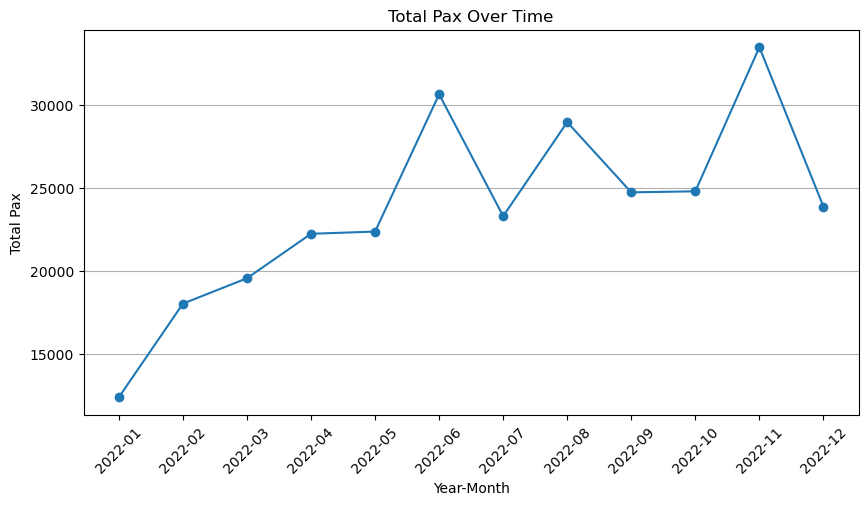

In [142]:
x = monthly_aggregated['year'].astype(str) + '-' + monthly_aggregated['month'].astype(str).str.zfill(2)
y = monthly_aggregated['total_pax']

plt.figure(figsize=(10, 5))
plt.plot(x, y, marker='o', linestyle='-')
plt.title('Total Pax Over Time')
plt.xlabel('Year-Month')
plt.ylabel('Total Pax')
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.show()

The month with the most amount of pax in the orders is November 2022. This is likely because many companies are planning for year end events before their employees fly off for holidays in December. 

The month with the least amount of pax in the orders is January 2022. This is probably because restrictions had just eased and the Singapore government allowed larger Work-Related Events of between 51 and 1,000 participants. 

**Plot the months against the revenue**

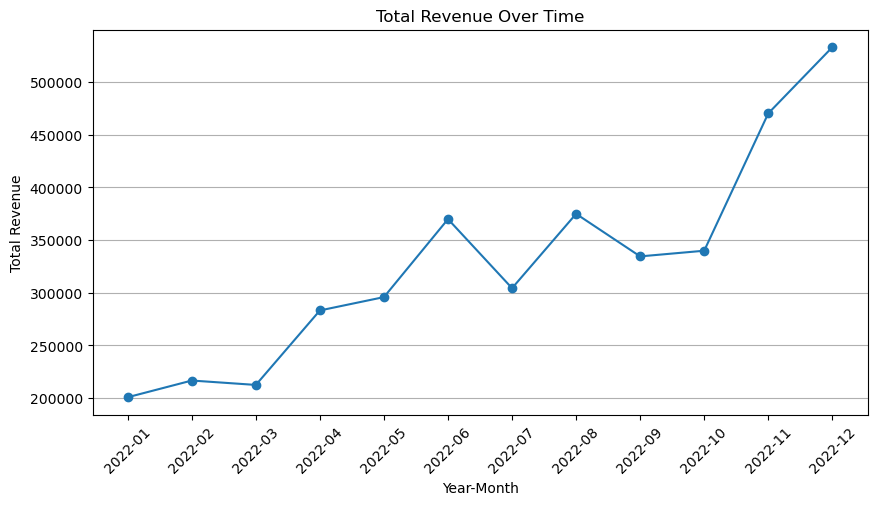

In [143]:
x = monthly_aggregated['year'].astype(str) + '-' + monthly_aggregated['month'].astype(str).str.zfill(2)
y = monthly_aggregated['total_revenue']

plt.figure(figsize=(10, 5))
plt.plot(x, y, marker='o', linestyle='-')
plt.title('Total Revenue Over Time')
plt.xlabel('Year-Month')
plt.ylabel('Total Revenue')
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.show()

Here we can see that there is a clear upward trend from the start of 2022 to the end of 2022. This could be due to the easing of restrictions as the months go by.

**Plot the months against the total pax and total revenue**

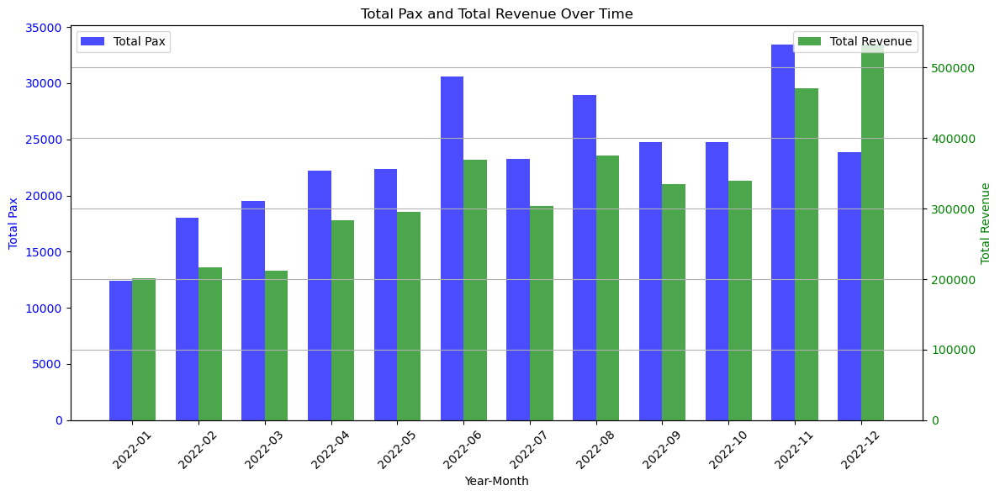

In [144]:
# Data
months = monthly_aggregated['year'].astype(str) + '-' + monthly_aggregated['month'].astype(str).str.zfill(2)
total_pax = monthly_aggregated['total_pax']
total_revenue = monthly_aggregated['total_revenue']

# Set the width of the bars
bar_width = 0.35

# Create an array of evenly spaced values for the x-axis
x = np.arange(len(months))

# Create a figure and axis
fig, ax1 = plt.subplots(figsize=(12, 6))

# Plot total_pax on the left y-axis
ax1.bar(x - bar_width/2, total_pax, bar_width, label='Total Pax', alpha=0.7, color='b')
ax1.set_xlabel('Year-Month')
ax1.set_ylabel('Total Pax', color='b')
ax1.tick_params(axis='y', labelcolor='b')

# Create a second y-axis
ax2 = ax1.twinx()

# Plot total_revenue on the right y-axis
ax2.bar(x + bar_width/2, total_revenue, bar_width, label='Total Revenue', alpha=0.7, color='g')
ax2.set_ylabel('Total Revenue', color='g')
ax2.tick_params(axis='y', labelcolor='g')

# Customize the x-axis labels
ax1.set_xticks(x)
ax1.set_xticklabels(months, rotation=45)

# Legend
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')

# Title and grid
plt.title('Total Pax and Total Revenue Over Time')
plt.grid(axis='y')

# Show the plot
plt.tight_layout()
plt.show()


**2.2) Which week recieves the most number of orders in terms of number of pax and revenue?**

In [136]:
# Convert 'pickup_date_time' to datetime
df['pickup_date_time'] = pd.to_datetime(df['pickup_date_time'])

# Filter deliveries for the year 2022
deliveries_2022 = df[df['pickup_date_time'].dt.year == 2022]

# Define a function to calculate the week number within a month (starting from Monday)
def calculate_week_number(row):
    days_in_week = 7
    day_of_month = row['pickup_date_time'].day
    day_of_week = row['pickup_date_time'].weekday() # Monday = 0, Sunday = 6
    if day_of_week >= 5: # If the first day of the week is Sunday, week 1 should start from the previous Monday
        day_of_month -= day_of_week - 4
    return (day_of_month - 1) // days_in_week + 1

# Apply the function to calculate the week number
deliveries_2022['week_number'] = deliveries_2022.apply(calculate_week_number, axis=1)

# Group by year, month, and week_number, and aggregate the data
weekly_aggregated = deliveries_2022.groupby(['year', 'month', 'week_number']).agg({
    'revenue': 'sum',
    'pax': 'sum'
}).reset_index()

# Print the dataframe
print(weekly_aggregated)

# Create a dictionary to hold the data
weeks = {}

# Iterate over weekly_aggregated to get the specific weeks. 
for index, row in weekly_aggregated.iterrows():
    # Access individual columns for each row
    year = row['year']
    month = row['month']
    week_number = row['week_number']
    total_revenue = row['revenue']
    total_pax = row['pax']
    
    if week_number in weeks:
        weeks[week_number]['total_revenue'] += total_revenue
        weeks[week_number]['total_pax'] += total_pax
    else:
        weeks[week_number] = {
            'week_number': week_number,
            'total_revenue': total_revenue,
            'total_pax': total_pax
        }

# Create a DataFrame from the weeks data
weeks_df = pd.DataFrame(list(weeks.values()))

# Drop week_number 0 and 5
weeks_df = weeks_df[(weeks_df['week_number'] != 0.0) & (weeks_df['week_number'] != 5.0)]

# Display the result
weeks_df

    year  month  week_number    revenue   pax
0   2022      1            1   14794.38  1224
1   2022      1            2   32530.95  2913
2   2022      1            3   37599.37  3802
3   2022      1            4   39046.41  2683
4   2022      1            5   76819.43  1754
5   2022      2            1   80245.59  3325
6   2022      2            2   44981.68  5227
7   2022      2            3   40337.22  4362
8   2022      2            4   51075.42  5100
9   2022      3            1   36365.61  3843
10  2022      3            2   41129.43  4097
11  2022      3            3   45100.97  4389
12  2022      3            4   60627.65  4809
13  2022      3            5   29239.84  2406
14  2022      4            1   50961.05  4006
15  2022      4            2   69308.88  5548
16  2022      4            3   64244.49  4898
17  2022      4            4   77121.03  6001
18  2022      4            5   21557.98  1770
19  2022      5            1   46301.11  3036
20  2022      5            2   646

/var/folders/gz/0s3_gtm96g31kmtlqtm7x4v80000gn/T/ipykernel_97174/2114581381.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deliveries_2022['week_number'] = deliveries_2022.apply(calculate_week_number, axis=1)


,week_number,total_revenue,total_pax
0,1.0,812846.74,57894.0
1,2.0,804293.52,62475.0
2,3.0,833149.59,61981.0
3,4.0,1107215.80,77712.0


The week with the highest revenue is week 4. This could be because some companies have hit the KPI's and would cater food to celebrate the good performance of the month. 

The week with the lowest revenue is week 2. This may be because it is the start of the month and companies may start promoting their event only at the start of the month.

**Plot the weeks against the total pax**

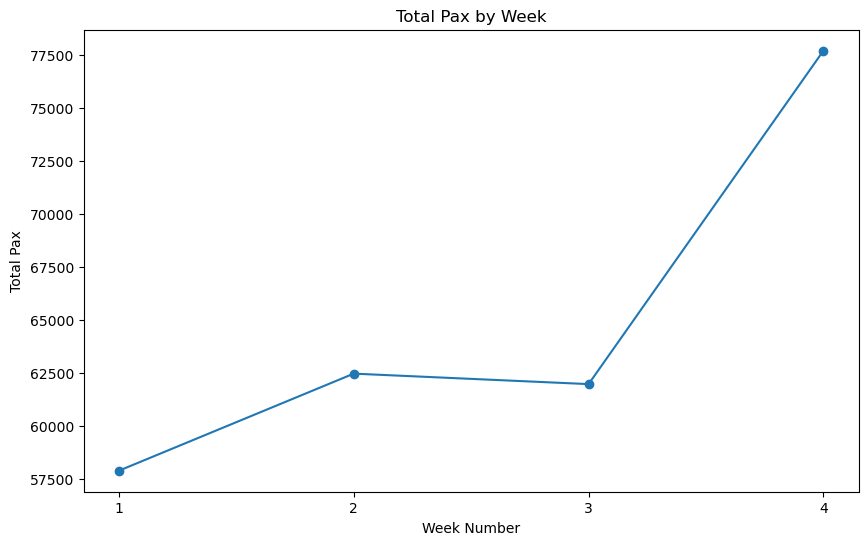

In [139]:
# Set the x-axis values you want to display
desired_x_values = [1, 2, 3, 4]

# Plot the data as a bar chart
plt.figure(figsize=(10, 6))
plt.plot(weeks_df['week_number'], weeks_df['total_pax'], marker='o', linestyle='-')
plt.title('Total Pax by Week')
plt.xlabel('Week Number')
plt.ylabel('Total Pax')

# Set the x-axis tick locations and labels
plt.xticks(desired_x_values, desired_x_values)

# Show the plot
plt.show()

It seems like week 4 has the highest number of orders in terms of pax in a month.

**Plot the weeks against the total revenue**

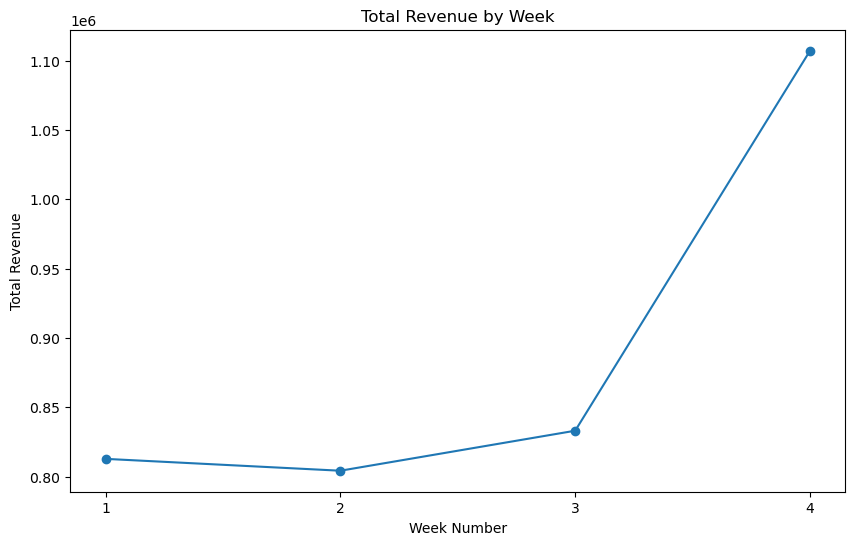

In [140]:
# Set the x-axis values you want to display
desired_x_values = [1, 2, 3, 4]

# Plot the data as a bar chart
plt.figure(figsize=(10, 6))
plt.plot(weeks_df['week_number'], weeks_df['total_revenue'], marker='o', linestyle='-')
plt.title('Total Revenue by Week')
plt.xlabel('Week Number')
plt.ylabel('Total Revenue')

# Set the x-axis tick locations and labels
plt.xticks(desired_x_values, desired_x_values)

# Show the plot
plt.show()

It seems like week 4 has the highest revenue in a month.

**Plot the weeks against the total pax and total revenue**

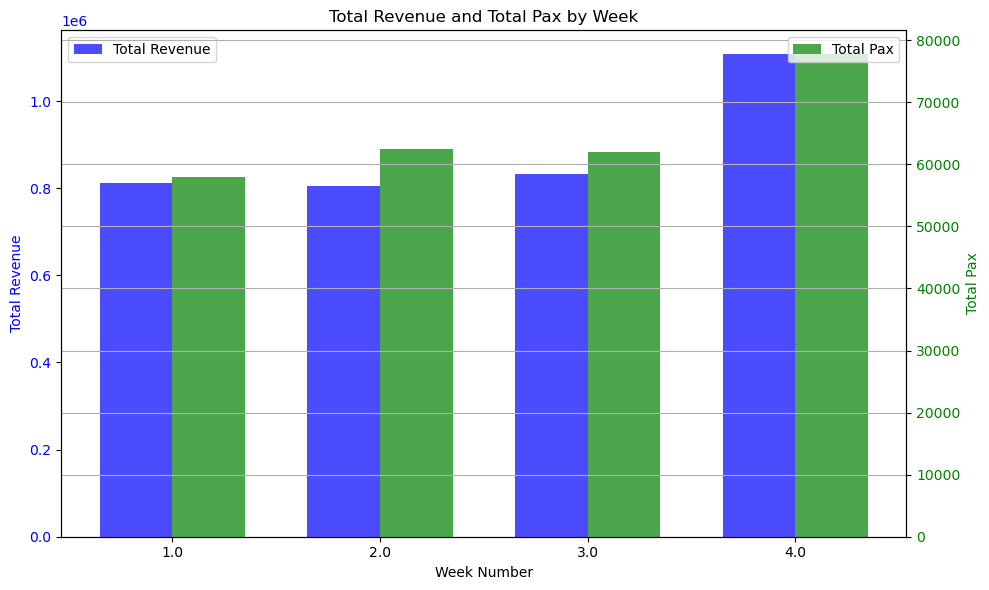

In [145]:
# Data
week_numbers = weeks_df['week_number']
total_revenue = weeks_df['total_revenue']
total_pax = weeks_df['total_pax']

# Set the width of the bars
bar_width = 0.35

# Create an array of evenly spaced values for the x-axis
x = np.arange(len(week_numbers))

# Create a figure and axis
fig, ax1 = plt.subplots(figsize=(10, 6))

# Plot total_revenue on the left y-axis
ax1.bar(x - bar_width/2, total_revenue, bar_width, label='Total Revenue', alpha=0.7, color='b')
ax1.set_xlabel('Week Number')
ax1.set_ylabel('Total Revenue', color='b')
ax1.tick_params(axis='y', labelcolor='b')

# Create a second y-axis
ax2 = ax1.twinx()

# Plot total_pax on the right y-axis
ax2.bar(x + bar_width/2, total_pax, bar_width, label='Total Pax', alpha=0.7, color='g')
ax2.set_ylabel('Total Pax', color='g')
ax2.tick_params(axis='y', labelcolor='g')

# Customize the x-axis labels
ax1.set_xticks(x)
ax1.set_xticklabels(week_numbers)

# Legends
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')

# Title and grid
plt.title('Total Revenue and Total Pax by Week')
plt.grid(axis='y')

# Show the plot
plt.tight_layout()
plt.show()


**2.3) Which day recieves the most number of orders in terms of number of pax and revenue?**

In [128]:
# Convert 'pickup_date_time' to datetime
df['pickup_date_time'] = pd.to_datetime(df['pickup_date_time'])

# Filter deliveries for the year 2022
deliveries_2022 = df[df['pickup_date_time'].dt.year == 2022]

# Define a function to calculate the day of the week (Monday to Sunday)
def calculate_day_of_week(row):
    return row['pickup_date_time'].weekday()  # Monday = 0, Sunday = 6

# Apply the function to calculate the day of the week
deliveries_2022['day_of_week'] = deliveries_2022.apply(calculate_day_of_week, axis=1)

# Group by day of the week (0 = Monday, 6 = Sunday) and aggregate the data
weekly_aggregated = deliveries_2022.groupby(['day_of_week']).agg({
    'revenue': 'sum',
    'pax': 'sum'
}).reset_index()

# Create a dictionary to hold the data
days = {
    0: 'Monday',
    1: 'Tuesday',
    2: 'Wednesday',
    3: 'Thursday',
    4: 'Friday',
    5: 'Saturday',
    6: 'Sunday'
}

# Add day names to the DataFrame
weekly_aggregated['day_name'] = weekly_aggregated['day_of_week'].map(days)

# Display the result
weekly_aggregated

/var/folders/gz/0s3_gtm96g31kmtlqtm7x4v80000gn/T/ipykernel_97174/565190031.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deliveries_2022['day_of_week'] = deliveries_2022.apply(calculate_day_of_week, axis=1)


,day_of_week,revenue,pax,day_name
0,0,509894.33,34555,Monday
1,1,610371.44,45532,Tuesday
2,2,726336.62,56757,Wednesday
3,3,729267.52,55177,Thursday
4,4,760187.11,57001,Friday
5,5,496800.82,30328,Saturday
6,6,103132.11,4851,Sunday


**Plot the days against the total pax**

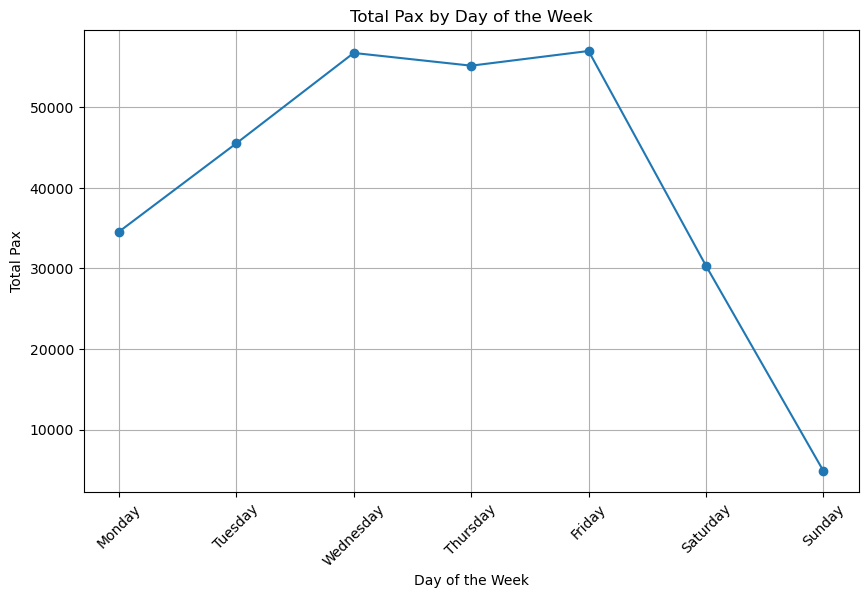

In [129]:
# Data
day_names = weekly_aggregated['day_name']
pax = weekly_aggregated['pax']

# Create a figure and axis
plt.figure(figsize=(10, 6))

# Plot pax as a line plot
plt.plot(day_names, pax, marker='o', linestyle='-')

# Labeling
plt.title('Total Pax by Day of the Week')
plt.xlabel('Day of the Week')
plt.ylabel('Total Pax')
plt.grid(True)

# Show the plot
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.show()

Wednesday to Friday are the most popular days that people would order mini buffets. 

**Plot the weeks against the total revenue**

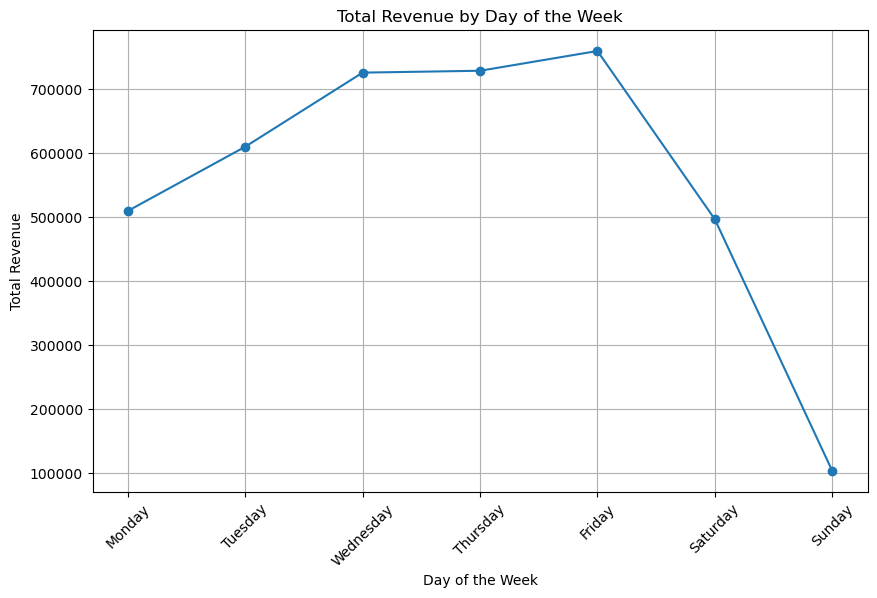

In [130]:
# Data
day_names = weekly_aggregated['day_name']
pax = weekly_aggregated['revenue']

# Create a figure and axis
plt.figure(figsize=(10, 6))

# Plot pax as a line plot
plt.plot(day_names, pax, marker='o', linestyle='-')

# Labeling
plt.title('Total Revenue by Day of the Week')
plt.xlabel('Day of the Week')
plt.ylabel('Total Revenue')
plt.grid(True)

# Show the plot
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.show()

**Which holiday is the most popular?**

In [171]:
# List of holiday dates in Singapore (you should replace these with actual holiday dates)
singapore_holidays = ['2022-01-01', '2022-02-01', '2022-02-02', '2022-04-15', '2022-05-01', '2022-05-03', '2022-05-15', '2022-07-10', '2022-08-09', '2022-10-24', '2022-12-25']

# Convert 'pickup_date_time' to datetime
df['pickup_date_time'] = pd.to_datetime(df['pickup_date_time'])

# Filter deliveries for the year 2022
deliveries_2022 = df[df['pickup_date_time'].dt.year == 2022]

# Define a function to calculate the day of the week (Monday to Sunday)
def calculate_day_of_week(row):
    return row['pickup_date_time'].weekday()  # Monday = 0, Sunday = 6

# Apply the function to calculate the day of the week
deliveries_2022['day_of_week'] = deliveries_2022.apply(calculate_day_of_week, axis=1)

# Filter the data for Singapore holidays
holiday_deliveries = deliveries_2022[deliveries_2022['pickup_date_time'].dt.strftime('%Y-%m-%d').isin(singapore_holidays)]

# Group by day of the week (0 = Monday, 6 = Sunday) and aggregate the data for holidays
holidays_aggregated = holiday_deliveries.groupby(holiday_deliveries['pickup_date_time'].dt.date).agg({
    'revenue': 'sum',
    'pax': 'sum'
}).reset_index()

# Define a dictionary of holiday names for specific dates
manual_holiday_names = {
    '2022-02-01': 'Chinese New Year day 1',
    '2022-02-02': 'Chinese New Year day 2',
    '2022-12-25': 'Christmas',
    # Add more dates and holiday names as needed
}

# Convert dates to a consistent format in both the DataFrame and the dictionary
holidays_aggregated['pickup_date_time'] = pd.to_datetime(holidays_aggregated['pickup_date_time']).dt.strftime('%Y-%m-%d')

# Loop through the DataFrame and update the "holiday_name" column
for date, holiday_name in manual_holiday_names.items():
    holidays_aggregated.loc[holidays_aggregated['pickup_date_time'] == date, 'holiday_name'] = holiday_name

# Display the result
holidays_aggregated

/var/folders/gz/0s3_gtm96g31kmtlqtm7x4v80000gn/T/ipykernel_97174/1392113299.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deliveries_2022['day_of_week'] = deliveries_2022.apply(calculate_day_of_week, axis=1)


,pickup_date_time,revenue,pax,holiday_name
0,2022-02-01,35192.82,1027,Chinese New Year day 1
1,2022-02-02,19596.82,640,Chinese New Year day 2
2,2022-12-25,45063.36,1243,Christmas


There are only orders on 3 holidays. The holidays are the Chinese New Year and Christmas. The holiday with the highest revenue and pax number is Christmas. 

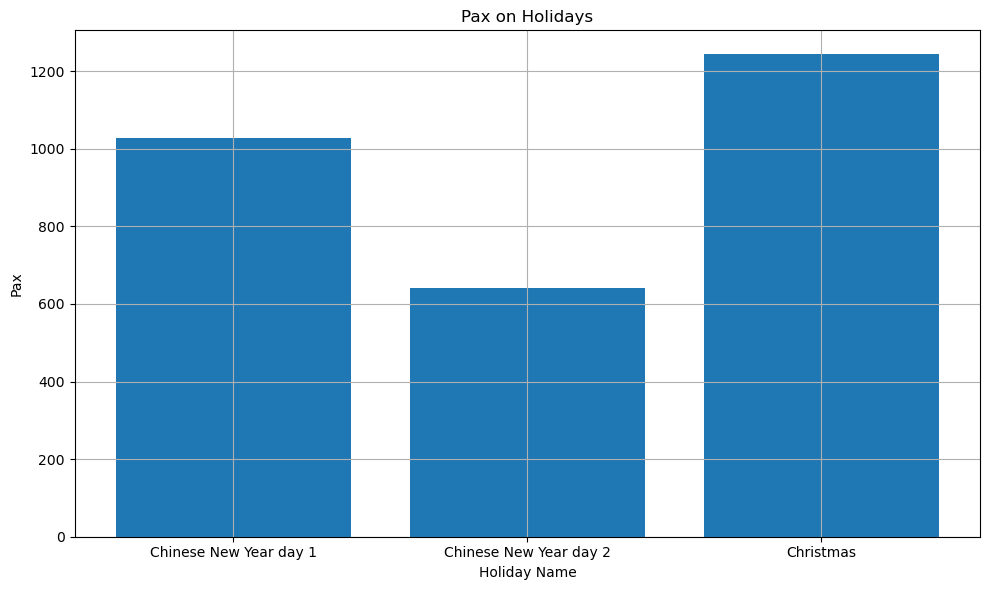

In [176]:
# Create a line plot
plt.figure(figsize=(10, 6))
plt.bar(holidays_aggregated['holiday_name'], holidays_aggregated['pax'])

# Labeling and title
plt.title('Pax on Holidays')
plt.xlabel('Holiday Name')
plt.ylabel('Pax')

# Customize the x-axis labels for better visibility
plt.xticks( ha='center')

# Show the plot
plt.grid(True)
plt.tight_layout()
plt.show()

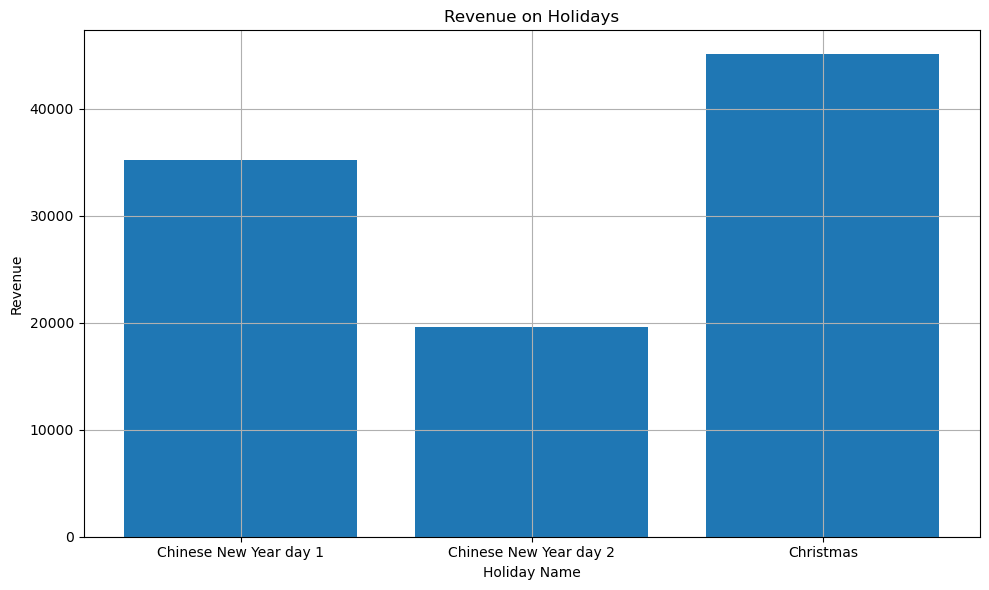

In [177]:
# Create a line plot
plt.figure(figsize=(10, 6))
plt.bar(holidays_aggregated['holiday_name'], holidays_aggregated['revenue'])

# Labeling and title
plt.title('Revenue on Holidays')
plt.xlabel('Holiday Name')
plt.ylabel('Revenue')

# Customize the x-axis labels for better visibility
plt.xticks( ha='center')

# Show the plot
plt.grid(True)
plt.tight_layout()
plt.show()

**2.4) What is the most popular order time in terms of number of pax and revenue?**

In [287]:
# Convert 'pickup_date_time' to datetime
df['serving_date_time'] = pd.to_datetime(df['serving_date_time'])

# Filter deliveries for the year 2022
deliveries_2022 = df[df['serving_date_time'].dt.year == 2022]

# Extract the pickup time component (e.g., "09:00:00")
deliveries_2022['serving_date_time'] = deliveries_2022['serving_date_time'].dt.strftime('%H:%M:%S')

# Group by pickup time and aggregate the data
time_aggregated = deliveries_2022.groupby(['serving_date_time']).agg({
    'revenue': 'sum',
    'pax': 'sum'
}).reset_index()

# Display the result
time_aggregated.head()

/var/folders/gz/0s3_gtm96g31kmtlqtm7x4v80000gn/T/ipykernel_97174/4098200935.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,serving_date_time,revenue,pax
0,04:30:00,10512.88,352
1,06:30:00,11991.05,1078
2,07:00:00,10963.78,869
3,07:15:00,4303.76,278
4,07:30:00,18184.38,1829


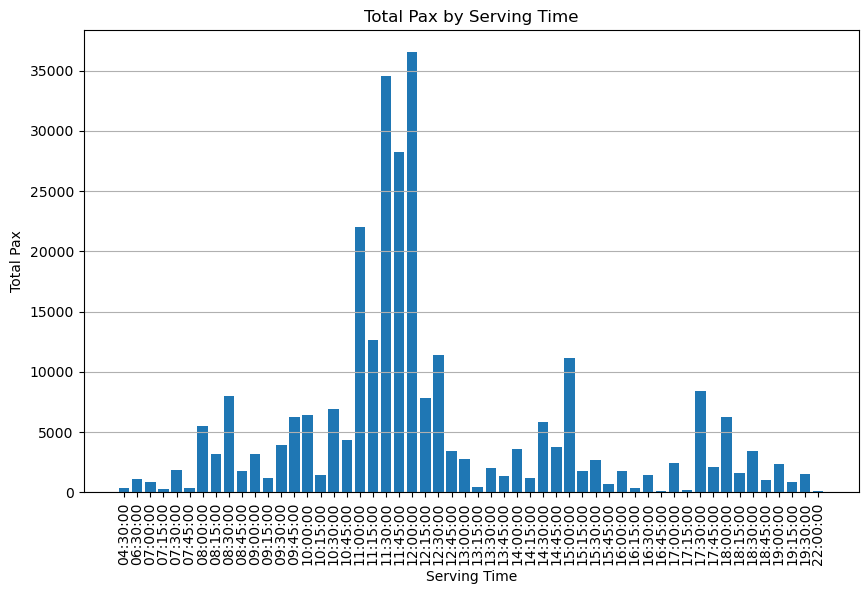

In [288]:
# You can adjust the figure size as needed
plt.figure(figsize=(10, 6))

# Plot the data as a bar chart
plt.bar(time_aggregated['serving_date_time'], time_aggregated['pax'], align='center')
plt.title('Total Pax by Serving Time')
plt.xlabel('Serving Time')
plt.ylabel('Total Pax')
plt.xticks(rotation=90)  # Rotate x-axis labels for better readability
plt.grid(axis='y')  # Show gridlines on the y-axis

# Show the plot
plt.show()

The most popular time for deliveries in terms of pax are from 11.30am to 12.00pm. This shows that most of the time people cater food for lunch. 

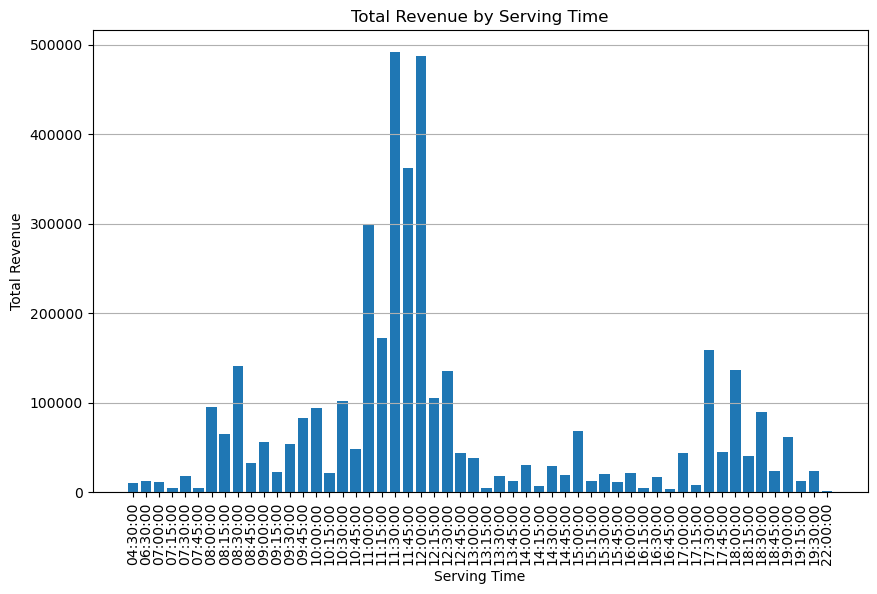

In [184]:
# You can adjust the figure size as needed
plt.figure(figsize=(10, 6))

# Plot the data as a bar chart
plt.bar(time_aggregated['serving_date_time'], time_aggregated['revenue'], align='center')
plt.title('Total Revenue by Serving Time')
plt.xlabel('Serving Time')
plt.ylabel('Total Revenue')
plt.xticks(rotation=90)  # Rotate x-axis labels for better readability
plt.grid(axis='y')  # Show gridlines on the y-axis

# Show the plot
plt.show()

The most popular time for deliveries in terms of revenue are from 11.30am to 12.00pm. This shows that most of the time people cater food for lunch.

## 3.) Sector (Who?)
Who are the people that order mini buffets?

**3.1) Which sector has the most amount of deliveries**

In [187]:
# Convert 'pickup_date_time' to datetime
df['pickup_date_time'] = pd.to_datetime(df['pickup_date_time'])

# Filter deliveries for the year 2022
deliveries_2022 = df[df['pickup_date_time'].dt.year == 2022]

# Group by 'sector' and aggregate the data
sector_aggregated = deliveries_2022.groupby(['sector']).agg({
    'revenue': 'sum',
    'pax': 'sum'
}).reset_index()

# Remove the sector called missing
sector_aggregated = sector_aggregated[sector_aggregated['sector'] != 'missing']

# Display the result
sector_aggregated

,sector,revenue,pax
0,Aerospace and Transportation,91062.76,7322
1,Agriculture and Environment,4104.83,308
2,Banking & Finance – non-whales,41912.87,3212
3,Banking & Finance – whales,383.73,22
4,Catering company,1088.72,181
5,Catering service,159428.41,15436
6,Co-working spaces,32686.91,2863
7,Consultancy,6099.10,442
8,Education,380618.36,31316
9,Education – NUS+NTU,25390.43,2305


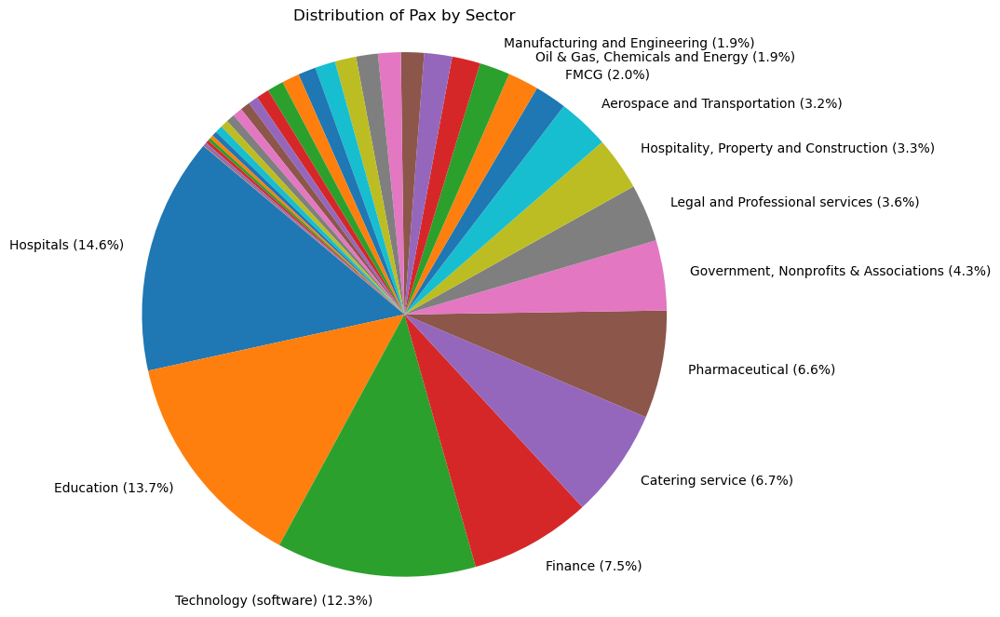

In [209]:
# Group the data by sector and sum the pax
sector_pax = sector_aggregated.groupby('sector')['pax'].sum()

# Sort the sectors in descending order of pax
sector_pax = sector_pax.sort_values(ascending=False)

# Set a threshold to display percentages
threshold = 1.8  # Display percentages only for slices with more than 5%

# Filter the sectors to display percentages for
visible_sectors = sector_pax[sector_pax / sector_pax.sum() * 100 >= threshold]

# Create labels with percentages for visible sectors
labels = [f'{sector} ({pax/sector_pax.sum()*100:.1f}%)' if sector in visible_sectors.index else '' for sector, pax in sector_pax.items()]

# Plot a pie chart
plt.figure(figsize=(8, 8))
plt.pie(sector_pax, labels=labels, startangle=140, autopct='')
plt.title('Distribution of Pax by Sector')
plt.axis('equal')  # Equal aspect ratio ensures that the pie chart is circular

# Display the pie chart
plt.show()

The most amount of deliveries in terms of pax goes to the hospitals sector. This could be because the people in hosiptals are more health-conscious and would order healthier choices from caterers that offer healtheir choices.

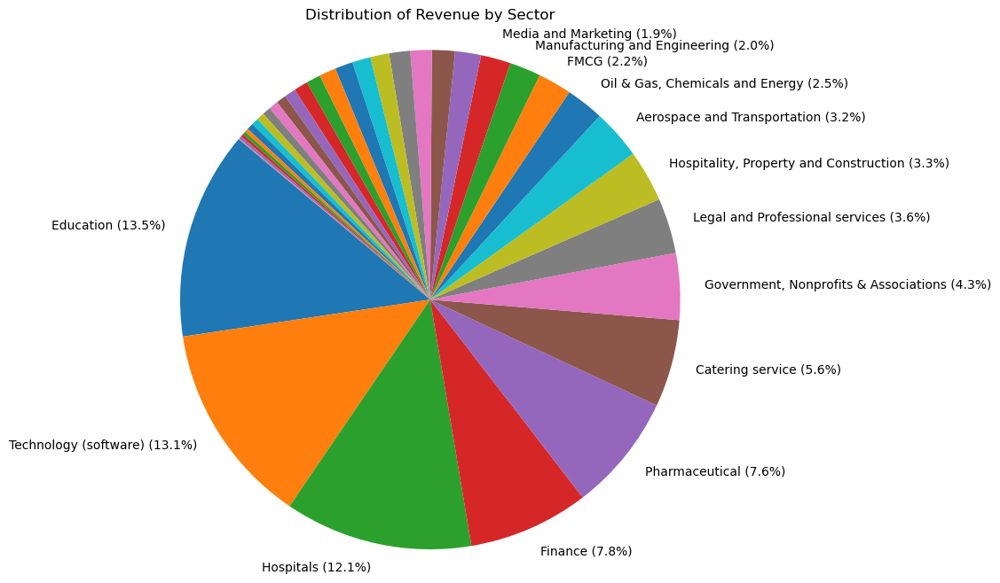

In [210]:
# Group the data by sector and sum the revenue
sector_revenue = sector_aggregated.groupby('sector')['revenue'].sum()

# Sort the sectors in descending order of revenue
sector_revenue = sector_revenue.sort_values(ascending=False)

# Set a threshold to display percentages
threshold = 1.8  # Display percentages only for slices with more than 5%

# Filter the sectors to display percentages for
visible_sectors = sector_revenue[sector_revenue / sector_revenue.sum() * 100 >= threshold]

# Create labels with percentages for visible sectors
labels = [f'{sector} ({revenue/sector_revenue.sum()*100:.1f}%)' if sector in visible_sectors.index else '' for sector, revenue in sector_revenue.items()]

# Plot a pie chart
plt.figure(figsize=(8, 8))
plt.pie(sector_revenue, labels=labels, startangle=140, autopct='')
plt.title('Distribution of Revenue by Sector')
plt.axis('equal')  # Equal aspect ratio ensures that the pie chart is circular

# Display the pie chart
plt.show()


The most amount of deliveries in terms of revenue goes to the education sector. This could be because they order more food per pax or better quality food than the hosiptals.

**3.2) Which company has the most amount of deliveries**

In [264]:
# Convert 'pickup_date_time' to datetime
df['pickup_date_time'] = pd.to_datetime(df['pickup_date_time'])

# Filter deliveries for the year 2022
deliveries_2022 = df[df['pickup_date_time'].dt.year == 2022]

# Group by 'company_name' and aggregate the data
company_aggregated = deliveries_2022.groupby(['company_name']).agg({
    'revenue': 'sum',
    'pax': 'sum'
}).reset_index()

# Remove the company_name called missing
company_aggregated = company_aggregated[company_aggregated['company_name'] != 'missing']

# Display the result
company_aggregated

,company_name,revenue,pax
0,BBC Global News Singapore Private Limited,1670.76,134
1,DeVries Global,1157.50,55
2,ISS Facility Services Pte Ltd,952.50,75
3,STT GDC Pte. Ltd,285.00,10
4,Silversea Cruises (UK) Ltd Singapore Branch,1719.36,64
5,*SCAPE Co. Ltd,4727.25,321
6,10x Genomics Pte Ltd,3215.82,198
7,2+1 Concepts,961.50,81
8,3M Singapore,15.00,24
9,3Shape,509.99,32


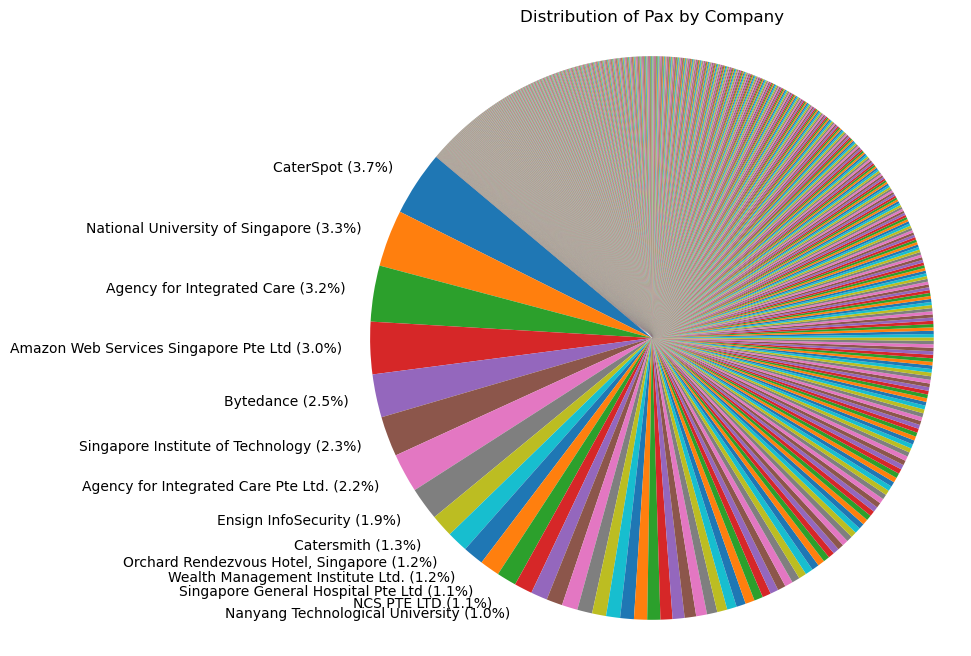

In [218]:
# Group the data by company_name and sum the pax
company_pax = company_aggregated.groupby('company_name')['pax'].sum()

# Sort the companies in descending order of pax
company_pax = company_pax.sort_values(ascending=False)

# Set a threshold to display percentages
threshold = 1  # Display percentages only for companies with more than 1%

# Filter the companies to display percentages for
visible_companies = company_pax[company_pax / company_pax.sum() * 100 >= threshold]

# Create labels with percentages for visible companies
labels = [f'{company} ({pax/company_pax.sum()*100:.1f}%)' if company in visible_companies.index else '' for company, pax in company_pax.items()]

# Plot a pie chart
plt.figure(figsize=(8, 8))
plt.pie(company_pax, labels=labels, startangle=140, autopct='')
plt.title('Distribution of Pax by Company')
plt.axis('equal')  # Equal aspect ratio ensures that the pie chart is circular

# Display the pie chart
plt.show()

Caterspot and the National University of Singapore has the highest amount of deliveries in terms of pax. This is representative of the sector findings before which showed education and one of the top sectors. However, this is not a good representation of the breakdown of the comapnies as there are too many slices in this pie chart. 

**Check which companies have a negative number for revenue**

In [220]:
# Filter companies with negative revenue
negative_revenue_companies = company_aggregated[company_aggregated['revenue'] < 0]

# Display the companies with negative revenue
print(negative_revenue_companies)

              company_name  revenue  pax
524                  Glyph   -102.3  100
1187  Singapore GP Pte Ltd    -23.0    6


There are 2 companies where the revenue is negative as the discount was more than the revenue. This could be due to a mistake on the company's part and ethen refunding the amount to them. Since there are only 2 companies, we will ignore these values.


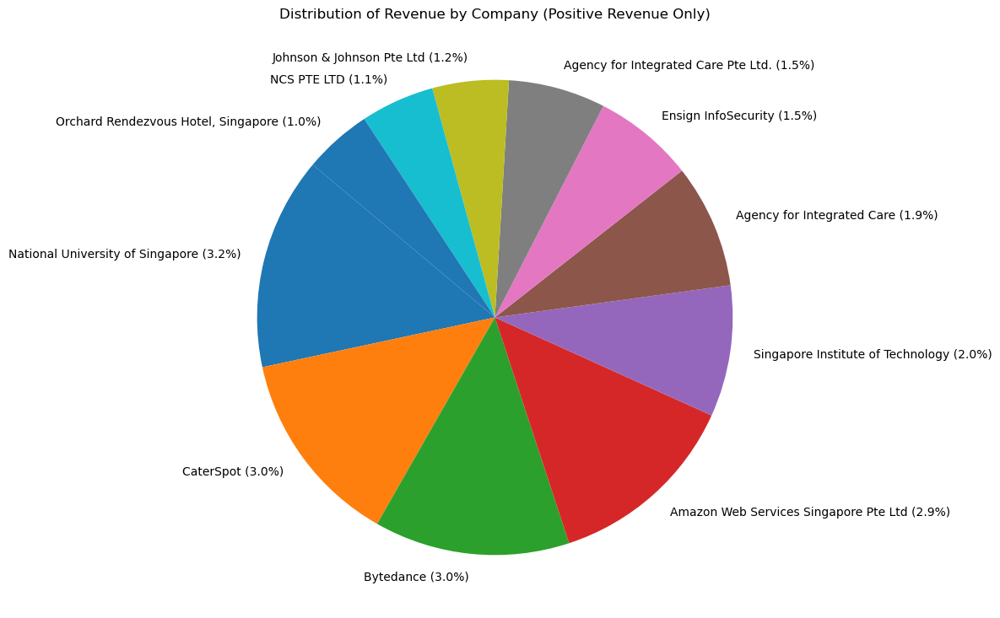

In [223]:
# Group the data by company_name and sum the revenue
company_revenue = company_aggregated.groupby('company_name')['revenue'].sum()

# Sort the companies in descending order of revenue
company_revenue = company_revenue.sort_values(ascending=False)

# Set a threshold to display percentages
threshold = 1  # Display percentages only for companies with more than 1%

# Filter out companies with negative revenue
positive_revenue_companies = company_revenue[company_revenue >= 0]

# Filter the companies to display percentages for
visible_companies = positive_revenue_companies[positive_revenue_companies / positive_revenue_companies.sum() * 100 >= threshold]

# Create labels with percentages for visible companies
labels = [f'{company} ({revenue/positive_revenue_companies.sum()*100:.1f}%)' for company, revenue in visible_companies.items()]

# Plot a pie chart
plt.figure(figsize=(8, 9))
plt.pie(visible_companies, labels=labels, startangle=140, autopct='')
plt.title('Distribution of Revenue by Company (Positive Revenue Only)')
plt.axis('equal')  # Equal aspect ratio ensures that the pie chart is circular

# Display the pie chart
plt.show()


In [285]:
# Convert 'pickup_date_time' to datetime
df['pickup_date_time'] = pd.to_datetime(df['pickup_date_time'])

# Filter deliveries for the year 2022
deliveries_2022 = df[df['pickup_date_time'].dt.year == 2022]

# Group by 'company_name' and aggregate the data
company_aggregated = deliveries_2022.groupby(['company_name', 'sector']).agg({
    'revenue': 'sum',
    'pax': 'sum'
}).reset_index()

# Remove the company_name and sector_name called missing and filter out negative revenue
company_aggregated = company_aggregated[
    (company_aggregated['company_name'] != 'missing') &
    (company_aggregated['sector'] != 'missing') &
    (company_aggregated['revenue'] > 0)  # Filter out negative revenue
]

# Display the result
company_aggregated

,company_name,sector,revenue,pax
0,BBC Global News Singapore Private Limited,Media and Marketing,1670.76,134
2,ISS Facility Services Pte Ltd,Manufacturing and Engineering,952.50,75
3,STT GDC Pte. Ltd,Information Technology,285.00,10
4,Silversea Cruises (UK) Ltd Singapore Branch,"Hospitality, Property and Construction",1719.36,64
5,*SCAPE Co. Ltd,Venues,4727.25,321
6,10x Genomics Pte Ltd,Pharmaceutical,3215.82,198
7,2+1 Concepts,Events Company,961.50,81
11,A*STAR,"Government, Nonprofits & Associations",24734.31,2071
13,A. Menarini Asia Pacific Holdings Pte Ltd,Pharmaceutical,15.00,15
14,A. Menarini Asia-Pacific Pte Ltd,Pharmaceutical,1478.10,120


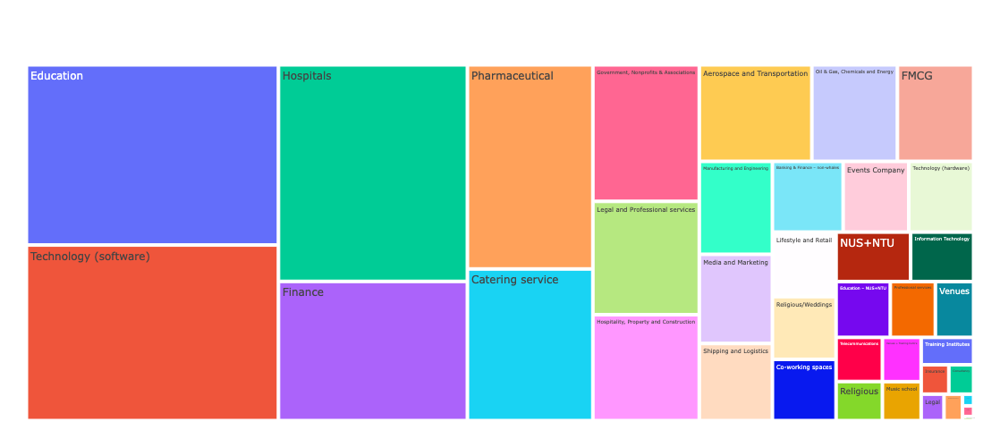

In [262]:
import plotly.express as px

# Extract data from your sector_aggregated DataFrame
sectors = sector_aggregated['sector']
revenues = sector_aggregated['revenue']

# Create the treemap
fig = px.treemap(
    names=sectors,  # Names of sectors
    parents=[""] * len(sectors),  # All sectors have no parent, so set to empty strings
    values=revenues,  # Values are the corresponding revenues
)

# Customize the layout
fig.update_layout(
    autosize=True,
    width=700,  # Adjust the width as needed
    height=500,  # Adjust the height as needed
    margin=dict(t=50, l=25, r=25, b=25)
)

fig.show()

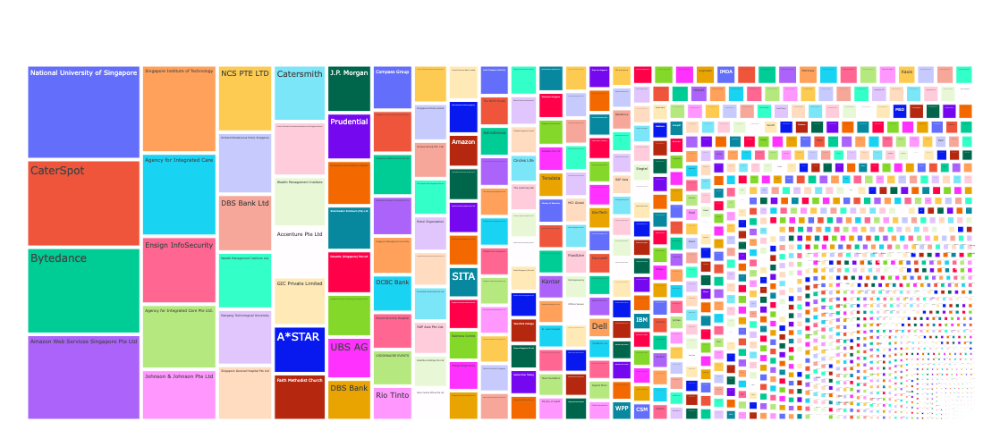

In [268]:
# Extract data from your company_aggregated DataFrame
companies = company_aggregated['company_name']
revenues = company_aggregated['revenue']

# Create the treemap
fig = px.treemap(
    names=companies,  # Names of companies
    parents=[""] * len(companies),  # All companies have no parent, so set to empty strings
    values=revenues,  # Values are the corresponding revenues
)

# Customize the layout
fig.update_layout(
    autosize=True,
    width=700,  # Adjust the width as needed
    height=500,  # Adjust the height as needed
    margin=dict(t=50, l=25, r=25, b=25)
)

fig.show()

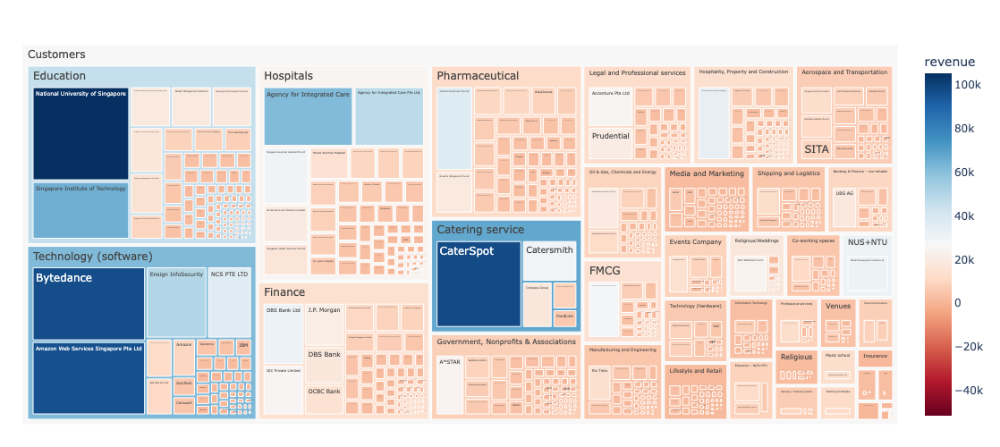

In [286]:
import plotly.express as px
import numpy as np
fig = px.treemap(company_aggregated, path=[px.Constant("Customers"), 'sector', 'company_name'], values='revenue',
                  color='revenue',
                  color_continuous_scale='RdBu',
                  color_continuous_midpoint=np.average(company_aggregated['revenue'], weights=company_aggregated['revenue']))

# Customize the layout
fig.update_layout(
    autosize=True,
    width=700,  # Adjust the width as needed
    height=500,  # Adjust the height as needed
    margin=dict(t=50, l=25, r=25, b=25)
)
fig.show()

**Customer segmentation**

In [305]:
# Create analysis date for Recency metric
today_date = pd.to_datetime("2022-12-31")

# Filter deliveries for the year 2022
deliveries_2022 = df[df['serving_date_time'].dt.year == 2022]

# Create RFM data frame with groupby, use lambda functions for calculating Recency, Frequency, and Monetary metrics
rfm_df = deliveries_2022.groupby("company_name").agg({
    'serving_date_time': lambda date: (today_date - date.max()).days,
    "event_id": lambda event: event.nunique(),
    "revenue": lambda revenue: revenue.sum()
}).reset_index()  # Add this line to reset the index and include 'company_name' as a column

# Rename columns for appropriate use
rfm_df.columns = ["company_name", "recency", "frequency", "monetary"]

# Remove the company_name called missing
rfm_df = rfm_df[rfm_df['company_name'] != 'missing']

# Display the dataframe
rfm_df.head()

,company_name,recency,frequency,monetary
0,BBC Global News Singapore Private Limited,50,3,1670.76
1,DeVries Global,70,2,1157.50
2,ISS Facility Services Pte Ltd,53,3,952.50
3,STT GDC Pte. Ltd,234,1,285.00
4,Silversea Cruises (UK) Ltd Singapore Branch,22,1,1719.36


In [306]:
# Change the recency, frequency and monetary to 5 values. The higher the score, the better.
rfm_df["monetary_score"] = pd.qcut(rfm_df["monetary"], 5, labels=[1, 2, 3, 4, 5]) 
rfm_df["frequency_score"] = pd.qcut(rfm_df["frequency"].rank(method="first"), 5, labels=[1, 2, 3, 4, 5])
rfm_df["recency_score"] = pd.qcut(rfm_df["recency"], 5, labels=[5, 4, 3, 2, 1]) 

# Create final RFM score
rfm_df["RFM_SCORE"] = (rfm_df["recency_score"].astype(str) + rfm_df["frequency_score"].astype(str))

# Display the dataframe
rfm_df

,company_name,recency,frequency,monetary,monetary_score,frequency_score,recency_score,RFM_SCORE
0,BBC Global News Singapore Private Limited,50,3,1670.76,4,4,4,44
1,DeVries Global,70,2,1157.50,4,3,4,43
2,ISS Facility Services Pte Ltd,53,3,952.50,4,4,4,44
3,STT GDC Pte. Ltd,234,1,285.00,1,1,1,11
4,Silversea Cruises (UK) Ltd Singapore Branch,22,1,1719.36,4,1,5,51
5,*SCAPE Co. Ltd,83,14,4727.25,5,5,3,35
6,10x Genomics Pte Ltd,86,4,3215.82,5,4,3,34
7,2+1 Concepts,141,1,961.50,4,1,2,21
8,3M Singapore,311,1,15.00,1,1,1,11
9,3Shape,83,2,509.99,3,3,3,33


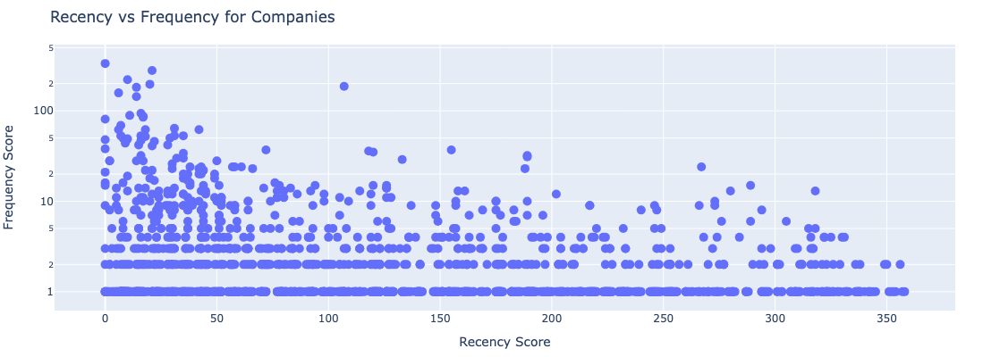

In [308]:
import plotly.graph_objects as go
fig = go.Figure(go.Scatter(
    x=rfm_df['recency'],
    y=rfm_df['frequency'],
    text=rfm_df['company_name'],
    mode='markers',  # Set mode to 'markers' for points
    marker=dict(size=10),  # Adjust marker size as needed
    textposition='top center'
))

fig.update_layout(
    xaxis_title='Recency Score',
    yaxis_title='Frequency Score',
    title='Recency vs Frequency for Companies',
    width=600,  # Adjust the width as needed
    height=400,  # Adjust the height as needed
    margin=dict(t=50, l=50, r=50, b=50),
    yaxis_type='log'  # Set y-axis to log scale
)

fig.show()

In [397]:
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler

# Assuming your DataFrame is named 'df' and you want to cluster based on 'recency', 'frequency', and 'monetary'
selected_features = rfm_df[['recency', 'frequency', 'monetary']]

# Standardize the features
scaler = StandardScaler()
scaled_features = scaler.fit_transform(selected_features)

# Choose DBSCAN parameters (eps and min_samples)
eps = 0.5  # Adjust this value based on your data
min_samples = 3  # Adjust this value based on your data

# Apply DBSCAN
dbscan = DBSCAN(eps=eps, min_samples=min_samples)
dbscan.fit(scaled_features)

# Get the cluster labels
cluster_labels = dbscan.labels_

# Assign the cluster labels back to your DataFrame
rfm_df['cluster'] = cluster_labels

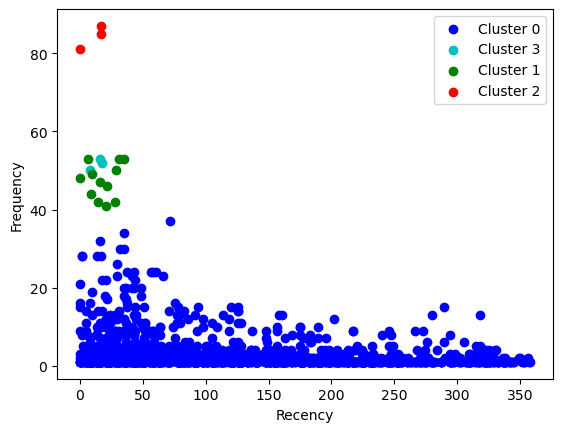

In [398]:
# Define a color map for the clusters
colors = ['b', 'g', 'r', 'c', 'm', 'y', 'k']

# Scatter plot for each cluster
for cluster_id in rfm_df['cluster'].unique():
    if cluster_id == -1:
        # Skip noise points (cluster_id = -1)
        continue
    cluster_data = rfm_df[rfm_df['cluster'] == cluster_id]
    plt.scatter(cluster_data['recency'], cluster_data['frequency'], c=colors[cluster_id % len(colors)], label=f'Cluster {cluster_id}')

# Plot noise points (cluster_id = -1) as gray
noise_data = rfm_df[rfm_df['cluster'] == -1]
# plt.scatter(noise_data['recency'], noise_data['frequency'], c='gray', label='Noise')

# Set axis labels and legend
plt.xlabel('Recency')
plt.ylabel('Frequency')
plt.legend(loc='best')

# Show the plot
plt.show()


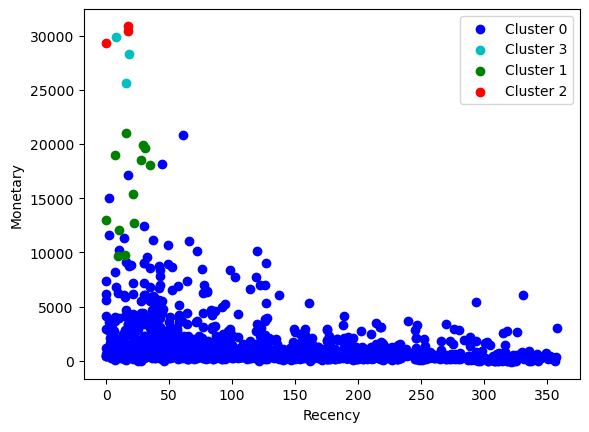

In [399]:
# Define a color map for the clusters
colors = ['b', 'g', 'r', 'c', 'm', 'y', 'k']

# Scatter plot for each cluster
for cluster_id in rfm_df['cluster'].unique():
    if cluster_id == -1:
        # Skip noise points (cluster_id = -1)
        continue
    cluster_data = rfm_df[rfm_df['cluster'] == cluster_id]
    plt.scatter(cluster_data['recency'], cluster_data['monetary'], c=colors[cluster_id % len(colors)], label=f'Cluster {cluster_id}')

# Plot noise points (cluster_id = -1) as gray
noise_data = rfm_df[rfm_df['cluster'] == -1]
# plt.scatter(noise_data['recency'], noise_data['monetary'], c='gray', label='Noise')

# Set axis labels and legend
plt.xlabel('Recency')
plt.ylabel('Monetary')
plt.legend(loc='best')

# Show the plot
plt.show()


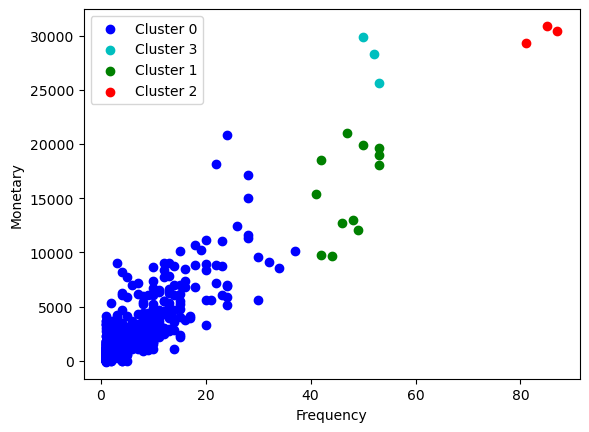

In [400]:
# Define a color map for the clusters
colors = ['b', 'g', 'r', 'c', 'm', 'y', 'k']

# Scatter plot for each cluster
for cluster_id in rfm_df['cluster'].unique():
    if cluster_id == -1:
        # Skip noise points (cluster_id = -1)
        continue
    cluster_data = rfm_df[rfm_df['cluster'] == cluster_id]
    plt.scatter(cluster_data['frequency'], cluster_data['monetary'], c=colors[cluster_id % len(colors)], label=f'Cluster {cluster_id}')

# Plot noise points (cluster_id = -1) as gray
noise_data = rfm_df[rfm_df['cluster'] == -1]
# plt.scatter(noise_data['frequency'], noise_data['monetary'], c='gray', label='Noise')

# Set axis labels and legend
plt.xlabel('Frequency')
plt.ylabel('Monetary')
plt.legend(loc='best')

# Show the plot
plt.show()


In [391]:
normal = rfm_df[rfm_df['cluster'] != -1]
normal.head()

# Assuming your DataFrame is named 'df' and you want to cluster based on 'recency', 'frequency', and 'monetary'
tuned_features = normal[['recency', 'frequency', 'monetary']]

# Standardize the features
scaler = StandardScaler()
scaled_tuned_features = scaler.fit_transform(tuned_features)

In [392]:
from sklearn.neighbors import NearestNeighbors
# Select n_neighbours = (chosen value for min_samples) - 1
nn = NearestNeighbors(n_neighbors=2)
nn_model = nn.fit(scaled_tuned_features)

# The distance variable contains an array of 
# distances between a data point and its nearest data point for all data points in data set
distances, indices = nn_model.kneighbors(scaled_tuned_features)

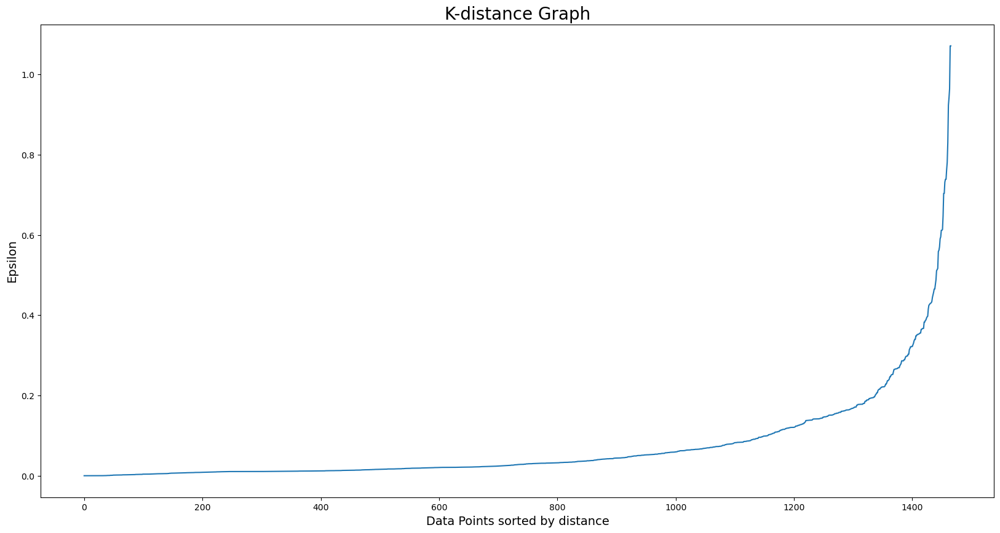

In [393]:
 # Plot K-distance graph
distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.figure(figsize=(20,10))
plt.plot(distances)
plt.title('K-distance Graph',fontsize=20)
plt.xlabel('Data Points sorted by distance',fontsize=14)
plt.ylabel('Epsilon',fontsize=14)
plt.show()

In [394]:
# Find the best epsilon value excluding 0.0
def find_best_epsilon(k_distances):
    
    # Exclude epsilon 0.0
    nonzero_epsilons = k_distances[k_distances > 0.0]
    
    # Compute differences between consecutive k-distances i.e. first derivative
    
    # The first derivative of the k-distances captures the rate of change of the curve. 
    # It indicates how quickly the k-distances are increasing as we move along the x-axis (data point index). 
    # However, the first derivative alone may not clearly distinguish the knee/elbow point because it can have fluctuations or noise.
    differences = np.diff(nonzero_epsilons)
    
    # Calculate the second derivative of differences
    
    # The second derivative provides information about the rate of change of the first derivative. 
    # It helps to identify points of inflection, where the curvature of the curve changes. 
    # In the context of the k-distance graph, the second derivative identifies the point where the rate of change of the first derivative is maximized. 
    # This corresponds to the knee/elbow point, which is the transition point of the curve.
    second_derivative = np.diff(differences)
    
    # By examining the second derivative, we can locate the knee/elbow point more reliably. 
    # The maximum value of the second derivative indicates the position where the curve changes its concavity, 
    # signifying the optimal epsilon value. It helps to distinguish the significant change in the slope of the k-distance graph, 
    # providing a more robust criterion for selecting the best epsilon value.
    
    # Find the knee/elbow point as the maximum second derivative
    best_index = np.argmax(second_derivative)
    
    # Add 1 to account for the index shift
    
    #When calculating the differences and the second derivative of the k-distances, 
    # we remove the first element (index 0) from the k-distances array because the differences and second derivative are based on the change between consecutive elements. As a result, 
    # the second derivative will have one less element compared to the original k-distances.
    best_epsilon = nonzero_epsilons[best_index + 1] 
    return best_epsilon


# Invoke function
best_epsilon = find_best_epsilon(distances)

# Print the best epsilon
print("Best Epsilon:", best_epsilon)

Best Epsilon: 0.9635998903845947


I found the best epsilon number but when I changed the number, I only ended up with 1 sector as the distance between clusters is too large. This results in no clear seperation of the clusters. Therefore, I have not chosen to use this.

**Price of bentos for each company**

There are 3 main menus in the minibuffet section. 
- Bentos
- Mini Buffets
- Seminars

There is no way to differentiate the mini buffets from the bentos and seminars so I have decided to get all the bento orders by only selecting the orders where bentos are explicitly mentioned in the special instructions. 

The price of a basic meal box or a plant-based meal box is \\$12.96 per box and meals on demand start from \\$14 per box. <br>
The price of a brekie box starts from \\$10.80 per box. <br>
The price of a seminar package starts from \\$22.68. <br>
The price of a mini buffet starts from \\$19.98. <br>
I only want to recommend the price of the basic and plant-based meal boxes. However, some companies may enjoy lower pricing due to the volume of orders. Therefore, I will only choose the rows where the cost_per_pax is from \\$9-\\$15. This means that I may include some brekkie boxes in the data as well. 

In [429]:
# Filter deliveries for the year 2022
deliveries_2022 = df[df['serving_date_time'].dt.year == 2022]

# Create a new DataFrame containing rows with 'bento' in special_instructions
bento_orders = deliveries_2022[deliveries_2022['special_instructions'].str.contains('bento', case=False, na=False)]

# Remove the company_name called missing
bento_orders = bento_orders[bento_orders['company_name'] != 'missing']

# Filter rows where cost_per_pax is between 9 and 15
bento_orders = bento_orders[(bento_orders['cost_per_pax'] >= 9) & (bento_orders['cost_per_pax'] <= 15)]

# Display the dataframe
bento_orders.head()

,event_id,event_state,sales_type,sector,company_name,customer_id,cost_per_pax,pax,address,postal_code,special_instructions,pickup_date_time,serving_date_time,revenue,postal_code_new,Latitude,Longitude,year,month,week
3,F3239,PUBLISHED,repeat,Hospitals,KK Women's and Children's Hospital,47121,9.3,50,"100 Bukit Timah Road, Department of Maternal F...",229899,50 x bento + cutlery | \n\nMs. Jasmine Lim – 9...,2022-01-06 10:30:00,2022-01-06 11:30:00,465.00,229899,1.310449,103.846650,2022,1,1
10,F3243,PUBLISHED,outbound,Hospitals,Tan Tock Seng Hospital Pte Ltd,50284,9.3,67,"Tan Tock Seng Hospital, Ward Main Building",308433,67 bento & cutlery | Please call upon arrival,2022-01-07 09:45:00,2022-01-07 10:45:00,623.10,308433,1.320631,103.848460,2022,1,1
11,F3247,PUBLISHED,outbound,Hospitals,Tan Tock Seng Hospital Pte Ltd,50284,9.3,43,"Tan Tock Seng Hospital, Ward Main Building",308433,43 bento & cutlery | Please call upon arrival,2022-01-07 09:45:00,2022-01-07 10:45:00,399.90,308433,1.320631,103.848460,2022,1,1
49,F3257,PUBLISHED,inbound,Hospitals,NTUC Health Co-Operative Ltd,50247,9.3,16,"NTUC Nursing (Geylang East) Nursing Home, 25 G...",389708,16 bento & cutlery,2022-01-10 10:00:00,2022-01-10 11:00:00,163.80,389708,1.319526,103.887743,2022,1,2
54,F3298,PUBLISHED,inbound,Catering service,CaterSpot,37766,9.3,75,"5 Burn Road, Tee Yih Jia Building, #05-01",369972,75 x bento + cuterly | Caterspot self collect ...,2022-01-10 11:45:00,2022-01-10 11:45:00,627.75,369972,1.335247,103.885008,2022,1,2


I will plot the prices of the bentos against time for the company which has the highest revenue which is the National University of Singapore. 

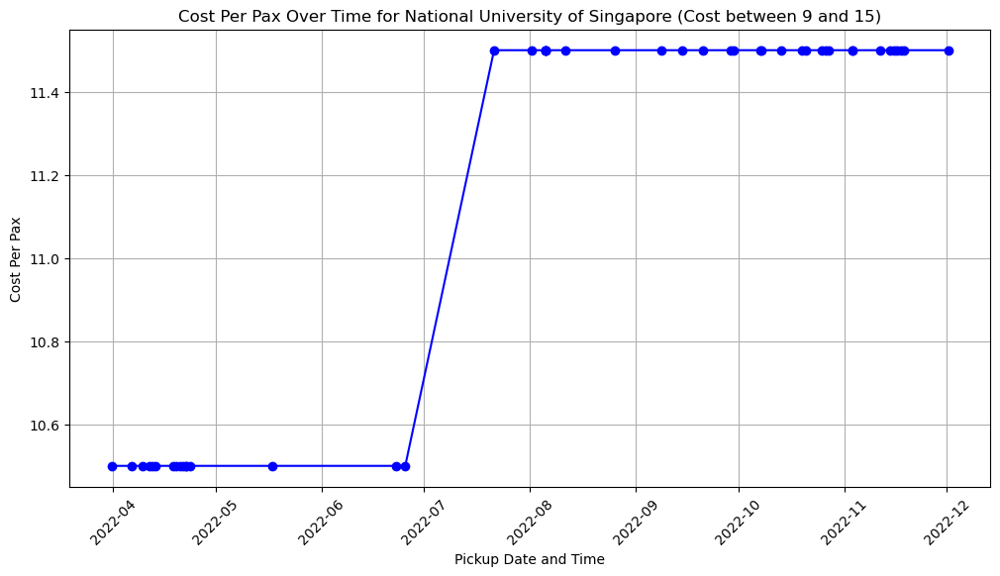

In [479]:
# Filter rows where cost_per_pax is between 9 and 15
bento_orders = bento_orders[(bento_orders['cost_per_pax'] >= 10) & (bento_orders['cost_per_pax'] <= 15)]

# Filter the DataFrame for the specific company
nus_data = bento_orders[bento_orders['company_name'] == "National University of Singapore"]

# Sort the data by pickup_date_time for chronological order (if not already sorted)
nus_data = nus_data.sort_values(by='pickup_date_time')

# Create the time series plot
plt.figure(figsize=(12, 6))
plt.plot(nus_data['pickup_date_time'], nus_data['cost_per_pax'], marker='o', linestyle='-', color='b')
plt.title('Cost Per Pax Over Time for National University of Singapore (Cost between 9 and 15)')
plt.xlabel('Pickup Date and Time')
plt.ylabel('Cost Per Pax')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.grid(True)
plt.show()

As we can see from the graph, it seems like the meal boxes were initially sold for \\$10.50 but later the price was increased to \\$11.50. This could be due to inflation and re-negotiation with the company.

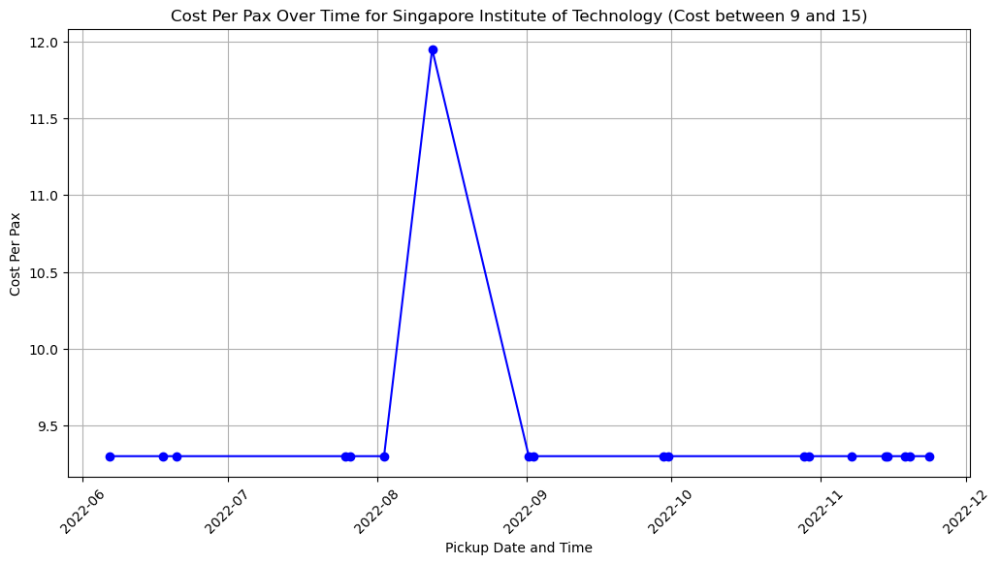

In [431]:
# Filter the DataFrame for the specific company
sit_data = bento_orders[bento_orders['company_name'] == "Singapore Institute of Technology"]

# Sort the data by pickup_date_time for chronological order (if not already sorted)
sit_data = sit_data.sort_values(by='pickup_date_time')

# Create the time series plot
plt.figure(figsize=(12, 6))
plt.plot(sit_data['pickup_date_time'], sit_data['cost_per_pax'], marker='o', linestyle='-', color='b')
plt.title('Cost Per Pax Over Time for Singapore Institute of Technology (Cost between 9 and 15)')
plt.xlabel('Pickup Date and Time')
plt.ylabel('Cost Per Pax')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.grid(True)
plt.show()

From the graph, we can see that the meal boxes are usually sold for \\$9.30. This is likely due to an contract they have signed with Grain. 

This concludes the EDA portion. We will move on to machine learning in the next portion. 